# Basic CCD Reduction & Photometry Lab

In this lab, you'll reduce basic CCD data and perform photometry.

Most of the document below goes through methods of handling the data.  At the end of this, you'll apply the methods we demonstrate on one filter to *at least two* of the other filters.  There are a total of 8 filters; you must choose *at least two broadband filters* (UBVRI) and *at least two* narrow-band filters; you are given H-alpha and V so you must choose from UBRI and OIII/SII.

This lab requires several steps:

1. Reduce the data to produce final images with uncertainty.
2. Produce photometric catalogs with uncertainty.
3. Cross-match those catalogs to produce color-color and color-magnitude diagrams.

### The Index & Links

Because this is a long notebook, and the whole lab is within the notebook, I've set up an index that has links to each subsection.  Each subsection heading has a link that points back to the Index.  I hope that will help you navigate the notebook.

# Index

This lab goes through those steps in detail:

0. [Acquire the Data](#0.-Acquire-the-data)
1. [Data Inspection](#1.-Data-Inspection)
 * [Exercise](#STUDENT-TASK-Section-1)
1. [Create master dark](#2.-Create-a-master-dark)
 * [Visualization: Successful Example](#Successful-Visualization-of--a-Dark:)
 * [Bad Pixel Masking](#Bad-Pixel-Masking)
 * [Dark Uncertainty](#Calculate-the-master-dark-variance-per-pixel)
1. [Flatfield](#3a.-Flat-Fielding)
 * [Exercise](#STUDENT-TASK-Section-3)
1. [Combine target data for H-alpha](#4.-Combine-the-target-data)
 * [Centroid Function](#X,Y-centroid-function)
1. [Uncertainty Calculation](#5.-Calculate-the-per-pixel-uncertainty)
1. [Repeat 3,4,5 for V-band](#6.-Repeat-the-above-for-the-V-filter)
1. [Assignment Part 1: Reduce two more bands](#ASSIGNMENT:-Redo-the-above-for-at-least-1-narrow-band-and-at-least-1-broad-band-filter)
1. [Photometry](#Photometry)
1. [Assignment Part 2: Obtain photometry & plot CMD/CCD](#ASSIGNMENT:-Create-photometric-catalogs-of-your-other-filters)

# 0. Acquire the data

Get the data from the dropbox URL:
[https://www.dropbox.com/s/ff0azzrfu5u3t4w/ngc6910.tar.gz?dl=0](https://www.dropbox.com/s/ff0azzrfu5u3t4w/ngc6910.tar.gz?dl=1)
and unpack it here.

You can either:
1. Go to that link, download the data, and double click on the file to extract the contents
2. Run the code below, which will automatically download & extract the data:

In [1]:
# This cell creates a function to check that the file downloaded correctly
# "md5sum" checking takes the sum of all the bits in the file in a particular way to make sure they line up right;
# if anything went awry with the download, this will tell us the download failed
# See https://en.wikipedia.org/wiki/Md5sum
import hashlib

def check_downloaded_successfully(filename, hashvalue='228ab118a3df9e39704c02c9405671a0'):
    md5 = hashlib.md5()
    if os.path.exists(filename):
        with open(filename, 'rb') as fh:
            md5.update(fh.read())
        if md5.hexdigest() == hashvalue:
            return True
    return False

In [2]:
# This cell will download the data from the dropbox link, then check that it downloaded
# it uses tqdm to make a progressbar
# The error messages returned by this cell, if you get any, should be meaningful
# If you ever want to learn more about how to download files in pieces, check out this code,
# but you don't need to know any of this for class.
import requests, os
from tqdm.notebook import tqdm

target_path = 'ngc6910.tar.gz'
if os.path.exists(target_path) and check_downloaded_successfully(target_path):
    print("Already downloaded!")
else:
    response = requests.get('https://www.dropbox.com/s/ff0azzrfu5u3t4w/ngc6910.tar.gz?dl=1', stream=True)
    response.raise_for_status()

    total_size_in_bytes= int(response.headers.get('content-length', 0))
    block_size = 1024 #1 Kibibyte
    progress_bar = tqdm(total=total_size_in_bytes, unit='iB', unit_scale=True)

    with open(target_path, 'wb') as fh:
        for data in response.iter_content(block_size):
            progress_bar.update(len(data))
            fh.write(data)
    if check_downloaded_successfully(target_path):
        print("Successfully downloaded!")
    else:
        print("Download failed!  Try again?  (you might need to remove the failed ngc6910.tar.gz first)")

Already downloaded!


In [3]:
# This cell extracts all the data from the tarfile so you have it in the current directory
import tarfile
tf = tarfile.open(target_path)
tf.extractall()

# 1. Data Inspection

[Index](#Index)

In [4]:
import os
import numpy as np
os.listdir('.')

['.ipynb_checkpoints',
 'Basic CCD Reduction and Photometry Lab.ipynb',
 'flat.2020-10-01T003154.725.0005.fits',
 'flat.2020-10-01T003235.116.0006.fits',
 'flat.2020-10-01T003302.393.0007.fits',
 'flat.2020-10-01T003346.597.0008.fits',
 'flat.2020-10-01T003440.988.0009.fits',
 'flat.2020-10-01T003544.419.0010.fits',
 'flat.2020-10-01T003658.543.0011.fits',
 'flat.2020-10-01T003757.458.0012.fits',
 'flat.2020-10-01T004020.432.0013.fits',
 'flat.2020-10-01T004129.849.0014.fits',
 'flat.2020-10-01T004234.251.0015.fits',
 'flat.2020-10-01T004338.656.0016.fits',
 'flat.2020-10-01T004443.061.0017.fits',
 'flat.2020-10-01T004502.454.0018.fits',
 'flat.2020-10-01T004516.806.0019.fits',
 'flat.2020-10-01T004531.148.0020.fits',
 'flat.2020-10-01T004545.498.0021.fits',
 'flat.2020-10-01T004604.746.0022.fits',
 'flat.2020-10-01T004619.086.0023.fits',
 'flat.2020-10-01T004633.442.0024.fits',
 'flat.2020-10-01T004647.960.0025.fits',
 'flat.2020-10-01T004742.059.0026.fits',
 'flat.2020-10-01T004831.4

The directory contains FITS files in a few categories:

In [5]:
# we start by searching out all the files called "flat <something> .fits"
# (glob uses "wildcards" - so * can be any combination of numbers and letters)
import glob
flatfilenames = glob.glob("flat*.fits") # there should be 37 flats
flatfilenames

['flat.2020-10-01T003154.725.0005.fits',
 'flat.2020-10-01T003235.116.0006.fits',
 'flat.2020-10-01T003302.393.0007.fits',
 'flat.2020-10-01T003346.597.0008.fits',
 'flat.2020-10-01T003440.988.0009.fits',
 'flat.2020-10-01T003544.419.0010.fits',
 'flat.2020-10-01T003658.543.0011.fits',
 'flat.2020-10-01T003757.458.0012.fits',
 'flat.2020-10-01T004020.432.0013.fits',
 'flat.2020-10-01T004129.849.0014.fits',
 'flat.2020-10-01T004234.251.0015.fits',
 'flat.2020-10-01T004338.656.0016.fits',
 'flat.2020-10-01T004443.061.0017.fits',
 'flat.2020-10-01T004502.454.0018.fits',
 'flat.2020-10-01T004516.806.0019.fits',
 'flat.2020-10-01T004531.148.0020.fits',
 'flat.2020-10-01T004545.498.0021.fits',
 'flat.2020-10-01T004604.746.0022.fits',
 'flat.2020-10-01T004619.086.0023.fits',
 'flat.2020-10-01T004633.442.0024.fits',
 'flat.2020-10-01T004647.960.0025.fits',
 'flat.2020-10-01T004742.059.0026.fits',
 'flat.2020-10-01T004831.440.0027.fits',
 'flat.2020-10-01T004920.811.0028.fits',
 'flat.2020-10-0

Let's make sure all the flats are indeed flats...

In [6]:
# using astropy.io.fits, we'll read the header of the first file and have a look
# We're looking to see what header keywords there are, and which one might tell us how
# to identify flats
from astropy.io import fits
flat0 = fits.open(flatfilenames[0])
flat0[0].header

SIMPLE  =                    T / file does conform to FITS standard             
BITPIX  =                   16 / number of bits per data pixel                  
NAXIS   =                    2 / number of data axes                            
NAXIS1  =                 3352 / length of data axis 1                          
NAXIS2  =                 2532 / length of data axis 2                          
EXTEND  =                    T / FITS dataset may contain extensions            
BZERO   =                32768 / offset data range to that of unsigned short    
BSCALE  =                    1 / default scaling factor                         
INSTRUME= 'SBIG CCD'           / CCD Name                                       
TELESCOP= 'Telescope Simulator' / Telescope name                                
OBSERVER= 'ADAM    '           / Observer name                                  
OBJECT  = 'FLAT    '           / Object name                                    
EXPTIME =         3.000000E+

Note that the `FRAME` keyword has value `Flat` - so it's telling us that this is a flat.

`IMAGETYP` also tells us that we are looking at a `Flat Frame`.

## Check the headers to see what image type the flats are


In [7]:
# let's look at the header of *each* supposedly flat-field file type to make sure they're all flats
for flatfn in flatfilenames:
    header = fits.getheader(flatfn)
    print(flatfn, header['IMAGETYP'], header['EXPTIME'])

flat.2020-10-01T003154.725.0005.fits Flat Frame 30.0
flat.2020-10-01T003235.116.0006.fits Flat Frame 10.0
flat.2020-10-01T003302.393.0007.fits Flat Frame 5.0
flat.2020-10-01T003346.597.0008.fits Flat Frame 5.0
flat.2020-10-01T003440.988.0009.fits Flat Frame 30.0
flat.2020-10-01T003544.419.0010.fits Flat Frame 30.0
flat.2020-10-01T003658.543.0011.fits Flat Frame 30.0
flat.2020-10-01T003757.458.0012.fits Flat Frame 30.0
flat.2020-10-01T004020.432.0013.fits Flat Frame 1.0
flat.2020-10-01T004129.849.0014.fits Flat Frame 60.0
flat.2020-10-01T004234.251.0015.fits Flat Frame 60.0
flat.2020-10-01T004338.656.0016.fits Flat Frame 60.0
flat.2020-10-01T004443.061.0017.fits Flat Frame 60.0
flat.2020-10-01T004502.454.0018.fits Flat Frame 10.0
flat.2020-10-01T004516.806.0019.fits Flat Frame 10.0
flat.2020-10-01T004531.148.0020.fits Flat Frame 10.0
flat.2020-10-01T004545.498.0021.fits Flat Frame 10.0
flat.2020-10-01T004604.746.0022.fits Flat Frame 10.0
flat.2020-10-01T004619.086.0023.fits Flat Frame 1

Now let's get the target data set, ngc6910-2:

In [8]:
ngc6910_2_filenames = glob.glob("ngc6910-2*fits")
len(ngc6910_2_filenames) # there should be 50 files

50

What image types are there among these?

In [9]:
for fn in ngc6910_2_filenames:
    print(fn, fits.getheader(fn)['IMAGETYP'])

ngc6910-2.2020-09-30T223816.907.0084.fits Light Frame
ngc6910-2.2020-09-30T223828.367.0085.fits Light Frame
ngc6910-2.2020-09-30T223838.725.0086.fits Light Frame
ngc6910-2.2020-09-30T223848.067.0087.fits Light Frame
ngc6910-2.2020-09-30T223858.430.0088.fits Light Frame
ngc6910-2.2020-09-30T223912.878.0089.fits Light Frame
ngc6910-2.2020-09-30T223923.241.0090.fits Light Frame
ngc6910-2.2020-09-30T223933.563.0091.fits Light Frame
ngc6910-2.2020-09-30T223942.914.0092.fits Light Frame
ngc6910-2.2020-09-30T223952.250.0093.fits Light Frame
ngc6910-2.2020-09-30T224006.999.0094.fits Light Frame
ngc6910-2.2020-09-30T224017.535.0095.fits Light Frame
ngc6910-2.2020-09-30T224027.900.0096.fits Light Frame
ngc6910-2.2020-09-30T224038.341.0097.fits Light Frame
ngc6910-2.2020-09-30T224048.699.0098.fits Light Frame
ngc6910-2.2020-09-30T224102.453.0099.fits Light Frame
ngc6910-2.2020-09-30T224112.807.0100.fits Light Frame
ngc6910-2.2020-09-30T224123.138.0101.fits Light Frame
ngc6910-2.2020-09-30T224132.

As you can see, some are darks (`IMAGETYP` is `Dark Frame`). Let's split those out:

In [10]:
# this cell does some sorting for us
# these "inline loops" go through each element of a list and do something
# in this case, we're looping through each filename `fn` in the list `ngc6910_2_filenames`
# and we keep the file if its IMAGETYP is Dark Frame, and we reject it (toss it out) if IMAGETYP
# is not Dark Frame.
# The original list, ngc6910_2_filenames, remains unchanged!  We just create a new list that is
# a subset of the original
ngc6910_2_dark_filenames = [fn for fn in ngc6910_2_filenames
                            if fits.getheader(fn)['IMAGETYP'] == 'Dark Frame']
len(ngc6910_2_dark_filenames) # there should be 10 darks

10

In [11]:
# We do the same thing as above, but only keep the Light Frame imagetyp's
ngc6910_2_light_filenames = [fn for fn in ngc6910_2_filenames
                            if fits.getheader(fn)['IMAGETYP'] == 'Light Frame']
len(ngc6910_2_light_filenames) # there should be 40 "lights"

40

We need to split up the images by filter too, and let's look at the exposure times too

In [12]:
# loop through the light frames, print out their FILTER and EXPTIME header keywords
for fn in ngc6910_2_light_filenames:
    hdr = fits.getheader(fn)
    print(fn, hdr['FILTER'], hdr['EXPTIME'])

ngc6910-2.2020-09-30T223816.907.0084.fits U 5.0
ngc6910-2.2020-09-30T223828.367.0085.fits U 5.0
ngc6910-2.2020-09-30T223838.725.0086.fits U 5.0
ngc6910-2.2020-09-30T223848.067.0087.fits U 5.0
ngc6910-2.2020-09-30T223858.430.0088.fits U 5.0
ngc6910-2.2020-09-30T223912.878.0089.fits B 5.0
ngc6910-2.2020-09-30T223923.241.0090.fits B 5.0
ngc6910-2.2020-09-30T223933.563.0091.fits B 5.0
ngc6910-2.2020-09-30T223942.914.0092.fits B 5.0
ngc6910-2.2020-09-30T223952.250.0093.fits B 5.0
ngc6910-2.2020-09-30T224006.999.0094.fits V 5.0
ngc6910-2.2020-09-30T224017.535.0095.fits V 5.0
ngc6910-2.2020-09-30T224027.900.0096.fits V 5.0
ngc6910-2.2020-09-30T224038.341.0097.fits V 5.0
ngc6910-2.2020-09-30T224048.699.0098.fits V 5.0
ngc6910-2.2020-09-30T224102.453.0099.fits R 5.0
ngc6910-2.2020-09-30T224112.807.0100.fits R 5.0
ngc6910-2.2020-09-30T224123.138.0101.fits R 5.0
ngc6910-2.2020-09-30T224132.491.0102.fits R 5.0
ngc6910-2.2020-09-30T224142.831.0103.fits R 5.0
ngc6910-2.2020-09-30T224156.393.0104.fit

We can see: there are 8 filters (count them), each exposure is 5s.

For convenience, let's group them all up:

In [13]:
# we make a list of the filternames...
filternames = [fits.getheader(fn)['FILTER'] for fn in ngc6910_2_light_filenames]
# then use the concept of a "set", which can only have one of each, to thin it down so we don't have repeats:
filternames = set(filternames)
filternames

{'B', 'H-ALPHA', 'I', 'O III', 'R', 'SI II', 'U', 'V'}

In the cell above, we used a "set".  A set takes any list and reduces it to its unique elements.  For example, `["A","A","B","B"]` would have a set `{"A", "B"}`.

In [14]:
# use a little iteration hackery to sort the filenames by filter
# this is now using nested inline loops to make a new data structure
# You don't need to be able to do this for class, but mastering this sort of data structure manipulation
# is critical for data science and programming jobs
ngc6910_2_fn_dict = {
    filtername: [fn for fn in ngc6910_2_light_filenames
               if fits.getheader(fn)['FILTER'] == filtername]
    for filtername in filternames}

Now we have the data sorted by filtername in `ngc6910_2_fn_dict`.  We can see the filters:

In [15]:
ngc6910_2_fn_dict.keys()

dict_keys(['I', 'R', 'H-ALPHA', 'V', 'B', 'O III', 'U', 'SI II'])

or look at all the files sorted under one filter:

In [16]:
ngc6910_2_fn_dict['H-ALPHA']

['ngc6910-2.2020-09-30T224252.114.0109.fits',
 'ngc6910-2.2020-09-30T224302.469.0110.fits',
 'ngc6910-2.2020-09-30T224312.797.0111.fits',
 'ngc6910-2.2020-09-30T224323.159.0112.fits',
 'ngc6910-2.2020-09-30T224333.480.0113.fits']

## STUDENT TASK Section 1

Print the contents of one of the other filters in the dictionary:

In [17]:
ngc6910_2_fn_dict['U']

['ngc6910-2.2020-09-30T223816.907.0084.fits',
 'ngc6910-2.2020-09-30T223828.367.0085.fits',
 'ngc6910-2.2020-09-30T223838.725.0086.fits',
 'ngc6910-2.2020-09-30T223848.067.0087.fits',
 'ngc6910-2.2020-09-30T223858.430.0088.fits']

# 2. Create a master dark
[Index](#Index)

We're going to work with data collected into higher-dimensional arrays.

Each image that we've taken is a 2-dimensional array that is 3352 x 2532 pixels.

Frequently, we want to take the average of several images.  To do that, we have to stack the images on top of one another to make a "stack" or "cube" of images.

So, for example, below we're going to make a stack of all of our dark images.  It will be 3352x2532 pixels across.  We have 10 dark images, so it will be 10 pixels "deep" in the `z` direction.

The `z` direction is then the direction we'll want to average (or median) over to obtain our average dark.

The dimensions are `z,y,x`, so they are numbered `z=0`, `y=1`, `x=2`.

In [18]:
# load up all the darks in an array and check its shape
dark_data = np.array([fits.getdata(fn) for fn in ngc6910_2_dark_filenames])
dark_data.shape

(10, 2532, 3352)

In [19]:
# take the median across the zeroth axis, which is the one that corresponds to file number
master_dark = np.median(dark_data, axis=0)

## Data Inspection: How do you determine what "stretch" to use?

We need to look at the darks.  The next few cells will be an exercise in visualization.

In [20]:
# let's inspect the dark...
# This cell loads up the visualization tools we need
import pylab as pl
#pl.style.use('dark_background')
pl.rcParams['figure.figsize'] = (10,8)
pl.rcParams['image.origin'] = 'lower'

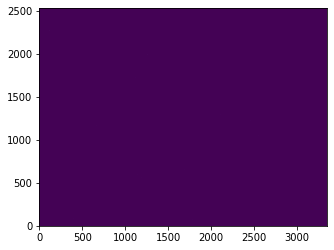

In [21]:
pl.imshow(master_dark)

We can't see a thing in that image!  It's solid purple.  Let's try rescaling using astropy's visualization tools:

In [22]:
from astropy.visualization import simple_norm

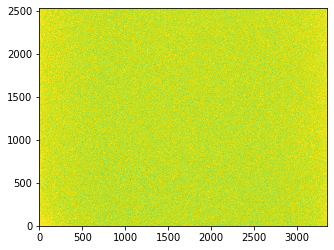

In [23]:
# Using a 99.5% upper threshold is a good starting point most of the time
# it means that the 0.5% brightest pixels will be solid yellow
pl.imshow(master_dark, norm=simple_norm(master_dark, max_percent=99.5))

The version above is too yellow, the noise is still hard to see...

### Successful Visualization of  a Dark:

[Index](#Index)

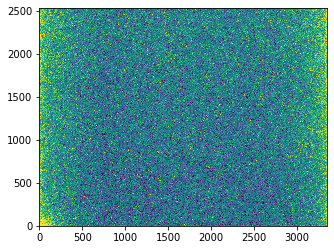

In [24]:
# now with min_percent = 0.5, the faintest 0.5% of pixels are solid blue
pl.imshow(master_dark, norm=simple_norm(master_dark, max_percent=99.5, min_percent=0.5))

The stretch in the above figure looks OK: we can see the noise; there is variation from pixel to pixel

In general, if you cannot see the noise, as in this figure, you need to change the stretch.

### Identifying the bad pixels

There are evidently some bad pixels in that vertical row in the top right.  There may be other bad pixels.

What defines a bad pixel?  There are many answers:

 * It is too bright: it always returns a value that is much higher than the number of photons received
 * It is unresponsive: it always returns the same number
 * It is too dark: it doesn't show any response to dark or light


We can try to figure out which pixels are bad using a histogram.  We will look for *outliers*, pixels that look too bright or too dark.

Before we make a histogram, though, think through what we're going to show:

* There are 2532 x 3352 pixels in this image, so about 6 million pixels - that's a lot!  It hints that we should probably use a log scale
* There are clearly some outliers, since the top 0.5% were clearly much brighter than the rest

So, let's try just simply using the default parameters with a log scale...

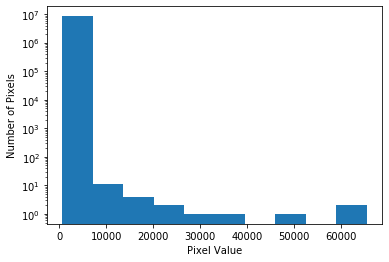

In [25]:
# we need to "ravel" the dark to make it 1-dimensional, otherwise we'll get 2532 histograms...
# ...which will take forever and probably crash your notebook!
_=pl.hist(master_dark.ravel(), log=True)
_=pl.xlabel("Pixel Value")
_=pl.ylabel("Number of Pixels")

We can already see the outliers here, but we can't really tell where the "good" pixels are, so let's try with more bins.

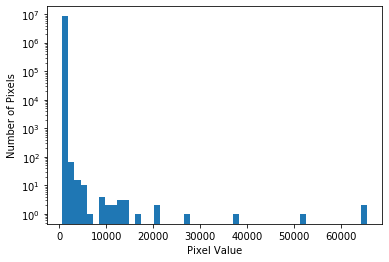

In [26]:
_=pl.hist(master_dark.ravel(), log=True, bins=50)
_=pl.xlabel("Pixel Value")
_=pl.ylabel("Number of Pixels")

## Bad Pixel Masking

[Index](#Index)

We can guess that anything with >10,000 counts in a 5s dark exposure is probably bad.  Let's get rid of those and try again...

In [27]:
badpix_mask = master_dark > 10000

How many bad pixels?

In [28]:
badpix_mask.sum()

18

Where are they?

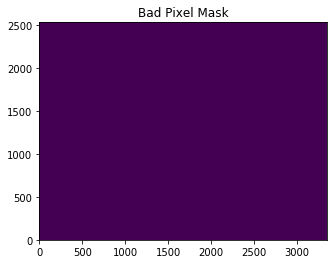

In [29]:
# they're shown in this image in yellow, but it's really hard to tell because they're so small
_=pl.imshow(badpix_mask)
_=pl.title("Bad Pixel Mask")

To "get rid of" the bad pixels, for the histogram case, we will just select the good pixels

The `~` operator is the "array not" operator.  It turns `False` to `True` and `True` to `False`.  For example:

In [30]:
x = np.array([True,False])
print("x:", x)
print("~x:", ~x)

x: [ True False]
~x: [False  True]


We can index our `master_dark` with the good-pixel boolean mask, i.e., ``master_dark[good_pixels]``.  That will give us a nice long 1-dimensional array with only the pixels with <10,000 counts included

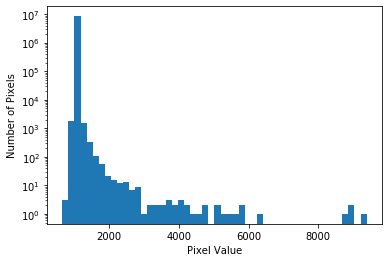

In [31]:
good_pixels = ~badpix_mask
_=pl.hist(master_dark[good_pixels], log=True, bins=50)
_=pl.xlabel("Pixel Value")
_=pl.ylabel("Number of Pixels")

The above still doesn't look Gaussian, so we can mask out pixels more aggressively and see if the remainder look more Gaussian.

In [32]:
badpix_mask = master_dark > 3000

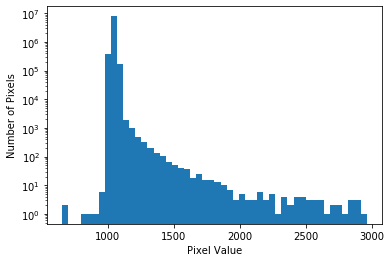

In [33]:
good_pixels = ~badpix_mask
_=pl.hist(master_dark[good_pixels], log=True, bins=50)
_=pl.xlabel("Pixel Value")
_=pl.ylabel("Number of Pixels")

We probably don't want to eat too far into the tail, but a cutoff at 1150 looks ok - things brighter than 1150 are clearly in a "tail" of the distribution.

We also have some "dark pixels" to get rid of...

In [34]:
badpix_mask = (master_dark > 1150) | (master_dark < 900)

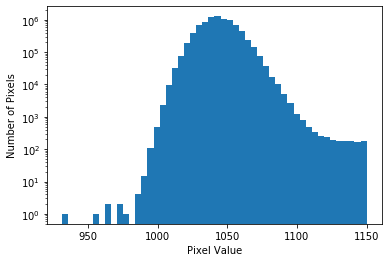

In [35]:
good_pixels = ~badpix_mask
_=pl.hist(master_dark[good_pixels], log=True, bins=50)
_=pl.xlabel("Pixel Value")
_=pl.ylabel("Number of Pixels")

In the above histogram, we can clearly see a Gaussian distribution.  There's still a "tail" to the right, but we don't want to call those all bad pixels - some of them are probably not exactly *bad*, they're just not *great*.

Why is there a tail of pixels to the right, though?  There are several possibilities, and let's address them by looking at the image below:

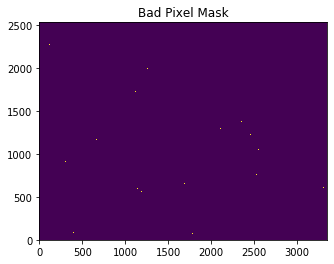

In [36]:
_=pl.imshow(badpix_mask)
_=pl.title("Bad Pixel Mask")

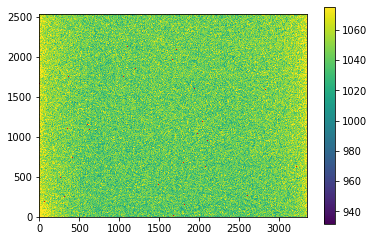

In [37]:
# this display uses a few tricks to show the 'bad' pixels as red
# "set_under" sets the color that the colors below the minimum displayed value are shown as
# (normally they'd be purple, but we're setting thcem to red)
current_cmap = pl.matplotlib.cm.get_cmap()
current_cmap.set_under(color='red')
_=pl.imshow(master_dark * good_pixels,
           norm=simple_norm(data=master_dark[good_pixels], min_cut=900, max_percent=99.)) 
_=pl.colorbar()

The above is our 'final' master dark.  If your monitor is good and your eyes are good, you might see some red pixels.  The next cell zooms in a bit to help you see them.


What is the "tail" of bright pixels we saw in the histogram above?  Those appear only at the edges of the image.
Most likely, these are pixels that are in some way affected by the process of producing the CCD; they either have a high bias offset or a high dark current.  With the data we have, we can't easily tell.

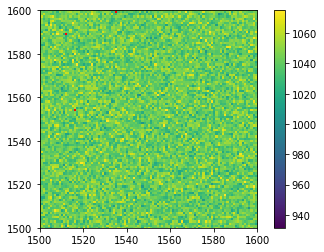

In [38]:
# same as above, but zoomed in so you can see the red pixels
_=pl.imshow(master_dark * good_pixels,
           norm=simple_norm(data=master_dark[good_pixels], min_cut=900, max_percent=99.)) 
_=pl.colorbar()
_=pl.axis((1500,1600,1500,1600))

In [39]:
# reset the colormap to get back to the original
current_cmap = pl.matplotlib.cm.get_cmap()
current_cmap.set_under(color=current_cmap.colors[0])

# Calculate the master-dark variance-per-pixel

[Index](#Index)

We need to propagate uncertainty, so we'll do that by tracking the uncertainty added by each step.

We start by estimating the standard deviation per pixel of the dark image using `np.std` to calculate the standard deviation.

In [40]:
dark_std = np.std(dark_data, axis=0)

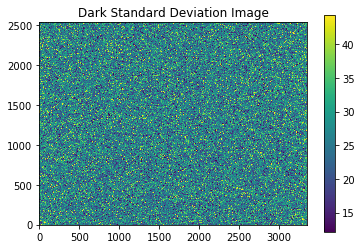

In [41]:
_=pl.imshow(dark_std, norm=simple_norm(dark_std, min_percent=0.5, max_percent=99.5))
_=pl.colorbar()
_=pl.title("Dark Standard Deviation Image")

# 3. Reduce one filter

We'll go through the full reduction exercise for two filters to remind you how it's done.

The rest is left up to you as part of the lab.

The first filter we'll go through is H-ALPHA

# 3a. Flat Fielding
[Index](#Index)

Now that we have a master dark, we need a master flat.

We're working on the H-alpha filter, so we need H-alpha flats

In [42]:
# assemble our 3-dimensional array of flat field images
halpha_flat_data = np.array([fits.getdata(fn)
                      for fn in flatfilenames
                      if fits.getheader(fn)['FILTER'] == 'H-ALPHA'
                     ])
halpha_flat_data.shape

(5, 2532, 3352)

Our darks are appropriate for the 5-second flats just as they are for the 5-second exposures.  However, there's not much dark current.

We need to subtract the dark primarily to get rid of the *bias*, i.e., the bulk offset in the master-dark.

In [43]:
# create our dark-subtracted flat
# we use "dsub" as shorthand for dark-subtracted
halpha_flat_dsub = halpha_flat_data - master_dark

Now, let's see how "even" the flats are.  Recall that flat fields are taken by pointing at a "flat" (uniformly illuminated) white surface.

This next plot will show the average across the `x` and `y` axis so we can see the average flat field value.

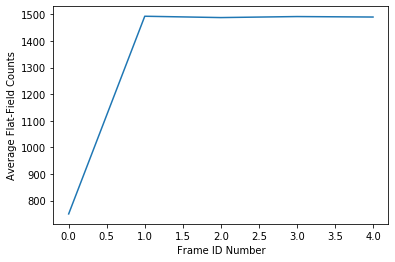

In [44]:
_=pl.plot(np.mean(halpha_flat_dsub, axis=(1,2)))
_=pl.xlabel("Frame ID Number")
_=pl.ylabel("Average Flat-Field Counts")

Well, there's one clear outlier.  Let's exclude that, then take the median flat

The outlier is index 0, so we can exclude it by removing it from the list...

This next example uses `array indexing` to select parts of an array.  If we had an array `x = np.array(['A','B','C','D','E'])`, we can extract the subset array `np.array(['B','C','E'])` by doing `y=x[[1,2,4]]`, where 1, 2, and 4 are the indices of B, C, and E.

In [45]:
x = np.array(['A','B','C','D','E'])
x[[1,2,4]]

array(['B', 'C', 'E'], dtype='<U1')

We use the same approach below.  We want to keep indices 1,2,3,4 and exclude index 0 from the above plot:

In [46]:
halpha_flat_dsub = halpha_flat_dsub[[1,2,3,4]]
halpha_flat_dsub.shape

(4, 2532, 3352)

Note that the image shape remained the same!  We operated only along the first axis, the `z` axis or axis `0`.

Now we get the median to get rid of cosmic rays:

In [47]:
med_flat_halpha = np.median(halpha_flat_dsub, axis=0)

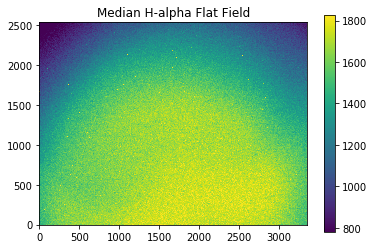

In [48]:
_=pl.imshow(med_flat_halpha, norm=simple_norm(med_flat_halpha, min_percent=0.5, max_percent=99.5))
_=pl.colorbar()
_=pl.title("Median H-alpha Flat Field")

We can get rid of the bad pixels by setting them to `nan` (not-a-number) and look again...

In [49]:
med_flat_halpha[badpix_mask] = np.nan

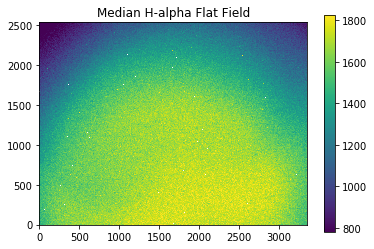

In [50]:
_=pl.imshow(med_flat_halpha, norm=simple_norm(med_flat_halpha, min_percent=0.5, max_percent=99.5))
_=pl.colorbar()
_=pl.title("Median H-alpha Flat Field")

Note that many of the brightest pixels disappeared when we did this!

We then want to *normalize* the flat field.  We want to normalize it such that the average value is 1.  We achieve that by dividing by the mean.

Now that it has nans in it, we need to use a slightly different approach: ``np.nanmean`` ignores the nans

In [51]:
norm_med_flat_halpha = med_flat_halpha / np.nanmean(med_flat_halpha)

## STUDENT TASK Section 3

Verify that the mean of `norm_med_flat_halpha` is 1:

In [52]:
np.nanmean(norm_med_flat_halpha)

1.0000000000000002

# 4. Combine the target data

[Index](#Index)

We'll load, dark-subtract, flat-field, align, and combine the target data now.

In [53]:
halpha_data = np.array([fits.getdata(fn) for fn in ngc6910_2_fn_dict['H-ALPHA']])
halpha_data.shape

(5, 2532, 3352)

We want to dark-subtract each of these.  Because we have made `halpha_data` into an array, we can just use array arithmetic to do this really simply:

In [54]:
halpha_dsub = halpha_data - master_dark
halpha_dsub.shape

(5, 2532, 3352)

The command above took `halpha_data`, which has shape `(5, 2532, 3352)`, and subtracted `master_dark`, which has shape `(2532,3352)`, from each of those `5` images.  Numpy has a set of rules of when you can do this kind of trick; they are called _broadcasting_ rules.

Broadcasting rules are the most useful things in the universe.  They can also be very tricky.

Then we flat-field also using array broadcasting tricks, as above:

In [55]:
halpha_dsub_flat = halpha_dsub / norm_med_flat_halpha

We then take the *median* across the images.  Since the images are in a 5-tall stack, we have to take the median across the 0'th axis, which is the "z" axis.

In [56]:
halpha_median = np.median(halpha_dsub_flat, axis=0)

C:\Users\mjfer\Anaconda3\lib\site-packages\numpy\lib\function_base.py:3405: RuntimeWarning: Invalid value encountered in median for 3045 results
  r = func(a, **kwargs)


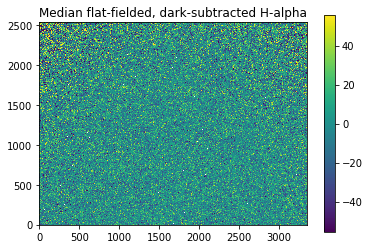

In [57]:
_=pl.imshow(halpha_median, norm=simple_norm(halpha_median, min_percent=0.5, max_percent=99.5))
_=pl.colorbar()
_=pl.title("Median flat-fielded, dark-subtracted H-alpha")

You can't see much in that image, but there are two stars, one at about (1500,2400), one around (1100, 1750).

Why are the stars so faint?  We'll investigate further.

Were the input images aligned well enough to combine?

We can zoom in on that one star at 1500,2400 and look at it from one frame to the next...

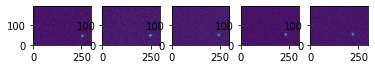

In [58]:
# we'll use subplots to show each frame and make small cutouts to show the star
for ii,img in enumerate(halpha_dsub):
    pl.subplot(1,5,ii+1)
    pl.imshow(img[2200:2400,1200:1500])

We clearly need to zoom in more...

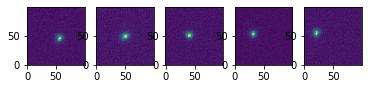

In [59]:
for ii,img in enumerate(halpha_dsub):
    pl.subplot(1,5,ii+1)
    pl.imshow(img[2200:2300,1400:1500])

The stars are not in the same place in these cutouts.  These images are *miserably* aligned.

(you might note that we can't see the noise in these images - they're only useful for seeing where the stars are, but not how bright they are)

We're going to use *moment analysis* to align these, just like last semester.

What do we need to do to determine the alignment offsets we need?

1. Mask the images so our moments aren't biased by "hot pixels" or noise
2. Compute moment1x, moment1y

The first step we'll take is to do a "selection" approach for our moment calculation, selecting only values
above a specified threshold.

In [60]:
# taking the standard deviation of the h-alpha image is a good first guess at the noise level
# we need the noise level to compute a threshold
# (we need nanstd b/c there are now nans in the data)
stddev = np.nanstd(halpha_median)

As a first pass, let's try masking at 3-sigma, and see how that turns out

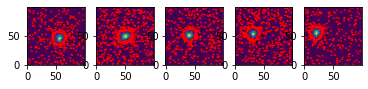

In [61]:
# We will mask at the 3-sigma level to downselect only "good" signal
for ii,img in enumerate(halpha_dsub):
    pl.subplot(1,5,ii+1)
    mask = img > (3 * stddev)
    masked_image = (img * mask)
    pl.imshow(masked_image[2200:2300,1400:1500])
    # we use "contour" to show the masked pixels; this will create a red outline
    # aroud the pixels included in the mask
    pl.contour(mask[2200:2300,1400:1500], levels=[0.5], colors='r')

See all those red pixels that aren't part of the star?  We don't want to include those, they'll add noise to our moment analysis.

Let's increase the threshold so we don't have any (or at least, very few) bad pixels:

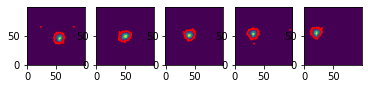

In [62]:
for ii,img in enumerate(halpha_dsub):
    pl.subplot(1,5,ii+1)
    mask = img > (6 * stddev)
    masked_image = (img * mask)
    pl.imshow(masked_image[2200:2300,1400:1500])
    pl.contour(mask[2200:2300,1400:1500], levels=[0.5], colors='r')

How did I pick 6-sigma?  I tried 3-sigma, 4-sigma, 5-sigma, and they all had a bunch of "junk" pixels that weren't part of the star.  At 6-sigma, we still have the whole star in every image, but only 1-2 outliers in image 0 and 3.

Now we compute moment 1.

# X,Y centroid function

[Index](#Index)

To save you some effort, here's a centroid function you can reuse:

In [63]:
def xycentroid(imagedata):
    """
    Determine the moment 1 along the x and y directions for a given input image.
    
    Parameters
    ----------
    imagedata : np.array
        The image data, probably a small cutout including only one star
        
    Returns
    -------
    mom1x, mom1y : float, float
        The x and y moment-1 values, respectively
    """
    yaxis = np.arange(imagedata.shape[0])
    xaxis = np.arange(imagedata.shape[1])
    mom1x = (imagedata * xaxis[None,:]).sum() / imagedata.sum()
    mom1y = (imagedata * yaxis[:,None]).sum() / imagedata.sum()
    
    return mom1x, mom1y

Then calculate the moments for each:

55.54633791693423 45.796022379191484
49.91267893231516 49.05256256949252
41.47055357168062 51.117281118999564
31.347886342935723 53.38791991856125
21.0545968819764 54.86974421247876


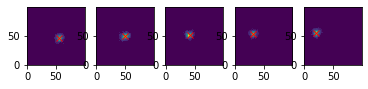

In [64]:
# mask at the 6-sigma level, as we determined above, and compute moment 1 in x & y
# then we overplot the moments so we can see how well we did
# Also, we record the moment1 values in the m1s list
m1s = []
for ii,img in enumerate(halpha_dsub):
    pl.subplot(1,5,ii+1)
    mask = img > (6 * stddev)
    masked_image = (img * mask)
    cutout = masked_image[2200:2300,1400:1500]
    pl.imshow(cutout)
    mom1x, mom1y = xycentroid(cutout)
    pl.plot(mom1x, mom1y, 'rx')
    print(mom1x, mom1y)
    m1s.append([mom1x, mom1y])

Now we need to shift all of the H-alpha images to a common frame, which we can pick to be the mean x, y:

In [65]:
# m1s is the list of measured x, y moment 1 values
m1s

[[55.54633791693423, 45.796022379191484],
 [49.91267893231516, 49.05256256949252],
 [41.47055357168062, 51.117281118999564],
 [31.347886342935723, 53.38791991856125],
 [21.0545968819764, 54.86974421247876]]

In [66]:
# we want our reference value to be the x-mean and y-mean, respectively:
refx, refy = np.mean(m1s, axis=0)
refx, refy

(39.866410729168436, 50.844706039744715)

In [67]:
# Then, for each image, we calculate how much we need to shift that images to reach our reference:
shiftxy = np.array(m1s) - np.array([refx, refy])
shiftxy

array([[ 15.67992719,  -5.04868366],
       [ 10.0462682 ,  -1.79214347],
       [  1.60414284,   0.27257508],
       [ -8.51852439,   2.54321388],
       [-18.81181385,   4.02503817]])

Then we use the `scipy.ndimage.shift` function to shift the images.

We're also going to `pad` the images so we don't cut off the edges.

In [68]:
# we want shiftyx, not shiftxy, because numpy uses z,y,x order, not x,y,z
shiftyx = shiftxy[:,::-1]
shiftyx

array([[ -5.04868366,  15.67992719],
       [ -1.79214347,  10.0462682 ],
       [  0.27257508,   1.60414284],
       [  2.54321388,  -8.51852439],
       [  4.02503817, -18.81181385]])

In [69]:
# We want to find the biggest amount any image will be shifted in either direction, so
# we take the maximum of the absolute value
# We want integers, so we take the "ceil" - ceil means "round up"
# `ceil` still returns a float, so we have to convert it to an int
max_shift = np.ceil(np.abs(shiftyx).max(axis=0)).astype('int')
max_shift

array([ 6, 19])

We "pad" the array by adding 19 zeros at either end along the X-direction and 6 zeros at either end along the Y-direction

In [70]:
halpha_dsub_padded = [np.pad(array=data,mode='constant',
                             pad_width=[(max_shift[0], max_shift[0]), (max_shift[1], max_shift[1])])
                      for data in halpha_dsub]

In [71]:
from scipy.ndimage import shift

Let's walk through what we're going to do with the ``shift`` function:

* the ``input`` is the data array, which is our padded array
* the ``shift`` is the $\Delta $y,$\Delta$x distance we want to move the image
* the ``order`` controls how we do the interpolation.  We're using 0'th order, aka 'nearest neighbor'

So for a single h-alpha image `data`, we would do:
``shift(input=data, shift=(dy, dx), order=0)``

But, we want to do this for *each* image and *each* shift we've measured.

If you have two lists of things that are the same length - like a list of images and a list of shift measurements for those measurements - you can `zip` them together. 

For example, `zip([1,2,3], ['A','B','C'])` gives you `[(1, 'A'), (2, 'B'), (3, 'C')]`, effectively.

So, we do that!  We `zip` our list-of-images (`halpha_dsub_padded`) with the appropriate shifts (`shiftxy`) and apply the shift to each of them in turn.

In [72]:
halpha_dsub_aligned = [shift(input=data, shift=-sxy, order=0)
                       for (data, sxy) in zip(halpha_dsub_padded, shiftyx)]

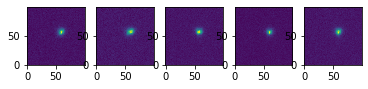

In [73]:
# now we can check to see they're aligned...
# They all end up in about the same place!
for ii,img in enumerate(halpha_dsub_aligned):
    pl.subplot(1,5,ii+1)
    pl.imshow(img[2200:2300,1400:1500])

Now we can re-combine the data by taking the median...

In [74]:
halpha_median_aligned = np.nanmedian(halpha_dsub_aligned, axis=0)

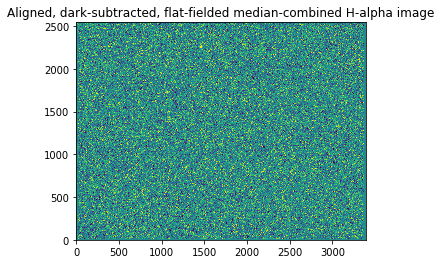

In [75]:
_=pl.imshow(halpha_median_aligned, norm=simple_norm(halpha_median_aligned, min_percent=0.5, max_percent=99.5))
_=pl.title("Aligned, dark-subtracted, flat-fielded median-combined H-alpha image")

You can now see our stars more clearly, and see a few more!

Let's compare the star we were looking at before/after combination:

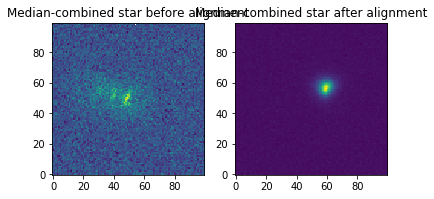

In [76]:
_=pl.subplot(1,2,1)
_=pl.imshow(halpha_median[2200:2300,1400:1500])
_=pl.title("Median-combined star before alignment")
_=pl.subplot(1,2,2)
_=pl.imshow(halpha_median_aligned[2200:2300,1400:1500])
_=pl.title("Median-combined star after alignment")

Much better!

# 5. Calculate the per-pixel uncertainty

[Index](#Index)

We have a few sources of uncertainty:

1. the light (poisson noise)
2. the dark current (poisson noise)
3. the flat field correction
4. the readnoise

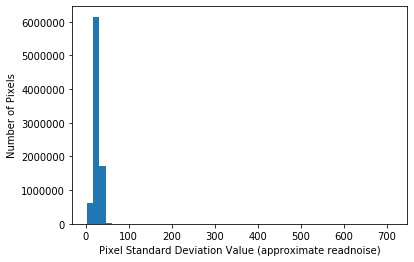

In [77]:
# we didn't take bias images, but we can approximate the readnoise by looking at the short dark images
readnoise_per_pixel = np.std(dark_data, axis=0)
_=pl.hist(readnoise_per_pixel[good_pixels], bins=50)
_=pl.xlabel("Pixel Standard Deviation Value (approximate readnoise)")
_=pl.ylabel("Number of Pixels")

In [78]:
median_readnoise = np.median(readnoise_per_pixel[good_pixels])
median_readnoise

26.32565288839006

We can't estimate the dark current noise because we don't have bias frames.  This was a mistake made during the observing run!  We have to hope dark current is negligible.

Next we calculate the Poisson error from the H-alpha light image.

In [79]:
# poisson noise from light count
light_poisson_noise = halpha_dsub**0.5
# we get a warning here because there are NaNs, and the sqrt(NaN) isn't valid!
# this is OK - we don't care about the pixels that are NaNs

C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in sqrt
  


The noise from the flat is the *fractional error* of the flat field image.

It is: $$\sigma^2_{flat,norm} = \frac{(\sigma^2_{RN} + \sigma^2_{light})^{1/2}}{S_{flat}}$$

Where $$\sigma^2_{light} = \frac{\Sigma \sigma_{flat~frame~i}^2}{N_{frames}} \approx \frac{S_{flat}}{N_{frames}}$$

In [80]:
N_halpha_flat_frames = len(halpha_flat_dsub)
flat_noise = (med_flat_halpha/N_halpha_flat_frames + median_readnoise**2)**0.5 / med_flat_halpha

The value of a given pixel is:

$$S = \frac{S_{raw} - S_{dark}}{S_{flat, norm}} = \frac{S_{darksub}}{S_{flat, norm}}$$

The total noise per pixel is then, because for $z=x/y$, $\sigma_{z}^2/z^2 = \sigma_{x}^2/x^2 + \sigma_{y}^2/y^2$ -> $\sigma_z^2 = \sigma_x^2/y^2 + \sigma_y^2 x^2 / y^4$:

$$ \sigma^2 = \frac{\sigma^2_{darksub} + \sigma^2_{RN} }{S_{flat, norm}^2} + \frac{\sigma^2_{flat, norm} S_{darksub}^2}{S_{flat, norm}^4}$$

In [81]:
halpha_error = (
    (halpha_dsub + median_readnoise**2)/(norm_med_flat_halpha**2) +
    (flat_noise**2 * halpha_dsub**2) /(norm_med_flat_halpha**4)
)**0.5          
halpha_error.shape

(5, 2532, 3352)

This is a stack of the per-frame errors.

However, we shifted the images before combining them.  So, we have to do the same here, since we're combining the noise pixel-by-pixel.

In this next cell, then, we're repeating the `pad` and `shift` operations, but now on the uncertainty frames:

In [82]:
halpha_error_padded = [np.pad(array=data, mode='constant',
                              pad_width=[(max_shift[0], max_shift[0]), (max_shift[1], max_shift[1])])
                       for data in halpha_error]
halpha_error_aligned = np.array([shift(input=data, shift=-sxy, order=0)
                                 for (data, sxy) in zip(halpha_error_padded, shiftyx)])

Finally, to combine the errors, we take the sum-of-squares of the error:

$$ \sigma^2_{median} = \frac{1}{N_{frames}} \Sigma \sigma^2_{dark-subtracted,~flat-fielded~H-\alpha} $$

Technically, the error-on-the-median isn't exactly the error-on-the-mean, but it's a good approximation.

In [83]:
n_halpha_frames = halpha_error_aligned.shape[0]
halpha_final_error = ((halpha_error_aligned**2).sum(axis=0) / n_halpha_frames)**0.5

We look at the signal-to-noise map to see what our per-pixel S/N:

In [84]:
halpha_signal_to_noise = halpha_median_aligned / halpha_final_error

C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


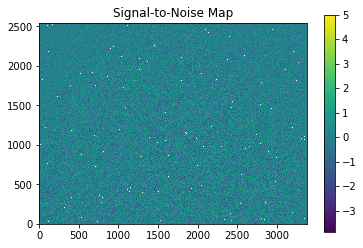

In [85]:
_=pl.imshow(halpha_signal_to_noise, vmax=5)
_=pl.colorbar()
_=pl.title("Signal-to-Noise Map")

# 6. Repeat the above for the V-filter

[Index](#Index)

In this section, we simply go through all the same processes as in [Section 4](#4.-Combine-the-target-data), except without all the description.

In [86]:
# load and dark subtract all at once
vband_flat_dsub = np.array([fits.getdata(fn) - master_dark
                      for fn in flatfilenames
                      if fits.getheader(fn)['FILTER'] == 'V'
                     ])
# check the means...
vband_flat_dsub.mean(axis=(1,2))

array([51322.47839816, 17470.99293312, 17919.04582896, 17920.91246655,
       17932.4830073 , 17931.13535063])

In [87]:
# exclude the first one again
vband_flat_dsub = vband_flat_dsub[[1,2,3,4,5]]
med_flat_vband = np.median(vband_flat_dsub, axis=0)
norm_med_flat_vband = med_flat_vband / np.nanmean(med_flat_vband)

In [88]:
vband = np.array([fits.getdata(fn) for fn in ngc6910_2_fn_dict['V']])
vband_dsub = vband - master_dark
vband_dsub_flat = vband_dsub / norm_med_flat_vband

C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


C:\Users\mjfer\Anaconda3\lib\site-packages\numpy\lib\function_base.py:3405: RuntimeWarning: Invalid value encountered in median for 2 results
  r = func(a, **kwargs)


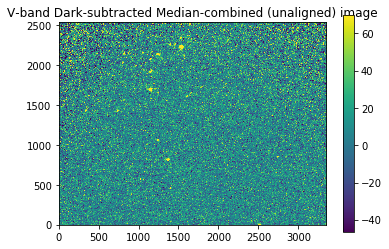

In [89]:
vband_dsub_median_flat_check = np.median(vband_dsub_flat, axis=0)
_=pl.imshow(vband_dsub_median_flat_check, norm=simple_norm(vband_dsub_median_flat_check, min_percent=0.5, max_percent=99.5))
_=pl.colorbar()
_=pl.title("V-band Dark-subtracted Median-combined (unaligned) image")

C:\Users\mjfer\Anaconda3\lib\site-packages\astropy\visualization\stretch.py:285: RuntimeWarning: invalid value encountered in log
  np.log(values, out=values)
C:\Users\mjfer\Anaconda3\lib\site-packages\matplotlib\colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


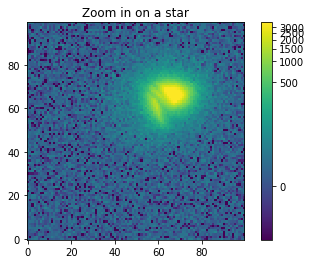

In [90]:
# pick a star to align on - we want one that's kind of isolated
_=pl.imshow(vband_dsub_median_flat_check[750:850, 1300:1400],
            norm=simple_norm(vband_dsub_median_flat_check, stretch='log', min_percent=10, max_percent=99.995))
_=pl.colorbar()
_=pl.title("Zoom in on a star")

51.913087133620074 57.78988772140297
54.676355308315905 61.24781107521244
64.91775779332124 63.858714004334075
68.6741154763273 68.32462069615072
65.92064020876995 69.42357456214242


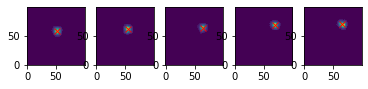

In [91]:
# mask at the 6-sigma level & calculate moment1s
stddev = np.nanstd(vband_dsub)
m1s = []
for ii,img in enumerate(vband_dsub):
    pl.subplot(1,5,ii+1)
    mask = img > (6 * stddev)
    masked_image = (img * mask)
    cutout = masked_image[750:850, 1300:1400]
    pl.imshow(cutout)
    mom1x, mom1y = xycentroid(cutout)
    pl.plot(mom1x, mom1y, 'rx')
    print(mom1x, mom1y)
    m1s.append([mom1x, mom1y])

In [92]:
refx, refy = np.mean(m1s, axis=0)
shiftxy = np.array(m1s) - np.array([refx, refy])
shiftyx = shiftxy[:,::-1]
max_shift = np.ceil(np.abs(shiftyx).max(axis=0)).astype('int')

In [93]:
vband_dsub_padded = [np.pad(array=data, mode='constant',
                            pad_width=[(max_shift[0], max_shift[0]), (max_shift[1], max_shift[1])])
                     for data in vband_dsub]

In [94]:
vband_dsub_aligned = [shift(input=data, shift=-sxy, order=0)
                       for (data, sxy) in zip(vband_dsub_padded, shiftyx)]

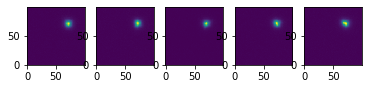

In [95]:
for ii,img in enumerate(vband_dsub_aligned):
    pl.subplot(1,5,ii+1)
    pl.imshow(img[750:850, 1300:1400])

Now we can re-combine the data by taking the median...

In [96]:
vband_median_aligned = np.median(vband_dsub_aligned, axis=0)

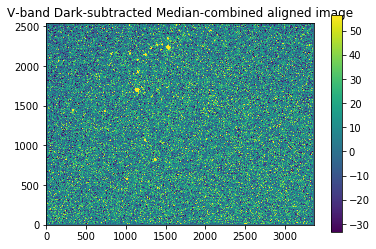

In [97]:
_=pl.imshow(vband_median_aligned, norm=simple_norm(vband_median_aligned, min_percent=0.5, max_percent=99.5))
_=pl.colorbar()
_=pl.title("V-band Dark-subtracted Median-combined aligned image")

In [98]:
flat_noise_vband = (med_flat_vband/len(vband_flat_dsub) + median_readnoise**2)**0.5 / med_flat_vband

C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.


In [99]:
vband_error = (
    (vband_dsub + median_readnoise**2)/(norm_med_flat_vband**2) +
    (flat_noise_vband**2 * vband_dsub**2) /(norm_med_flat_vband**4)
)**0.5

C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in multiply
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in sqrt
  after removing the cwd from sys.path.


In [100]:
vband_error_padded = [np.pad(array=data, mode='constant',
                             pad_width=[(max_shift[0], max_shift[0]), (max_shift[1], max_shift[1])])
                      for data in vband_error]
vband_error_aligned = np.array([shift(input=data, shift=-sxy, order=0)
                                 for (data, sxy) in zip(vband_error_padded, shiftyx)])
vband_final_error = ((vband_error_aligned**2).sum(axis=0) / vband_error_aligned.shape[0])**0.5

In [101]:
vband_signal_to_noise = vband_median_aligned / vband_final_error

C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


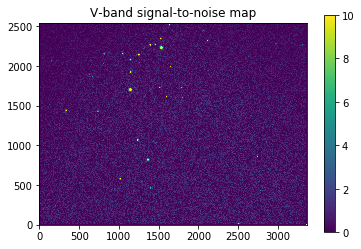

In [102]:
_=pl.imshow(vband_signal_to_noise, vmin=0, vmax=10)
_=pl.colorbar()
_=pl.title("V-band signal-to-noise map")

# ASSIGNMENT: Redo the above for at least 1 narrow-band and at least 1 broad-band filter

[Index](#Index)

## I Band

In [103]:
iband_flat_dsub = np.array([fits.getdata(fn) - master_dark
                      for fn in flatfilenames
                      if fits.getheader(fn)['FILTER'] == 'I'
                     ])
iband_flat_dsub.mean(axis=(1,2))

array([ 974.46682635, 5801.02540365, 8085.96897074, 8085.53680756,
       8079.76231286, 8028.45401398])

C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


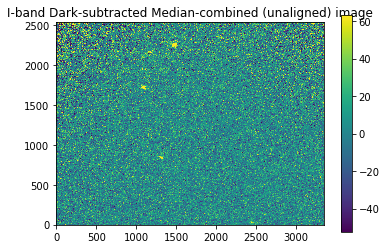

In [104]:
iband_flat_dsub = iband_flat_dsub[[2,3,4,5]]
med_flat_iband = np.median(iband_flat_dsub, axis=0)
norm_med_flat_iband = med_flat_iband / np.nanmean(med_flat_iband)
iband = np.array([fits.getdata(fn) for fn in ngc6910_2_fn_dict['I']])
iband_dsub = iband - master_dark
iband_dsub_flat = iband_dsub / norm_med_flat_iband

iband_dsub_median_flat_check = np.median(iband_dsub_flat, axis=0)
_=pl.imshow(iband_dsub_median_flat_check, norm=simple_norm(iband_dsub_median_flat_check, min_percent=0.5, max_percent=99.5))
_=pl.colorbar()
_=pl.title("I-band Dark-subtracted Median-combined (unaligned) image")

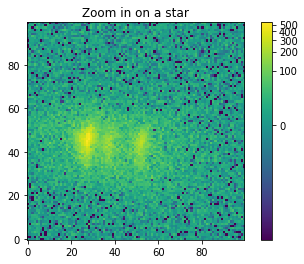

In [105]:
_=pl.imshow(iband_dsub_median_flat_check[800:900, 1275:1375],
            norm=simple_norm(iband_dsub_median_flat_check, stretch='log', min_percent=10, max_percent=99.995))
_=pl.colorbar()
_=pl.title("Zoom in on a star")

65.0986856864492 39.08197286978222
51.62396858243016 41.150456543168765
38.93551967980905 42.75063483680486
25.18268335905671 44.52146074500912
17.726158098443506 45.14631224110661


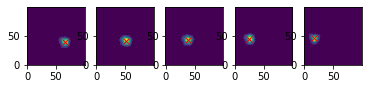

In [106]:
stddev = np.nanstd(iband_dsub)
m1s = []
for ii,img in enumerate(iband_dsub):
    pl.subplot(1,5,ii+1)
    mask = img > (6 * stddev)
    masked_image = (img * mask)
    cutout = masked_image[800:900, 1275:1375]
    pl.imshow(cutout)
    mom1x, mom1y = xycentroid(cutout)
    pl.plot(mom1x, mom1y, 'rx')
    print(mom1x, mom1y)
    m1s.append([mom1x, mom1y])

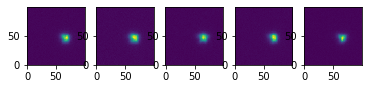

In [107]:
refx, refy = np.mean(m1s, axis=0)
shiftxy = np.array(m1s) - np.array([refx, refy])
shiftyx = shiftxy[:,::-1]
max_shift = np.ceil(np.abs(shiftyx).max(axis=0)).astype('int')
iband_dsub_padded = [np.pad(array=data, mode='constant',
                            pad_width=[(max_shift[0], max_shift[0]), (max_shift[1], max_shift[1])])
                     for data in iband_dsub]
iband_dsub_aligned = [shift(input=data, shift=-sxy, order=0)
                       for (data, sxy) in zip(iband_dsub_padded, shiftyx)]
for ii,img in enumerate(iband_dsub_aligned):
    pl.subplot(1,5,ii+1)
    pl.imshow(img[800:900, 1275:1375])

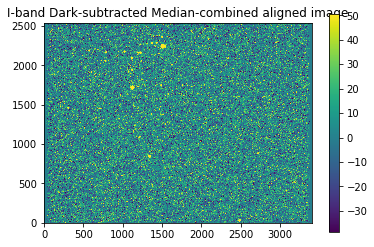

In [108]:
iband_median_aligned = np.median(iband_dsub_aligned, axis=0)
_=pl.imshow(iband_median_aligned, norm=simple_norm(iband_median_aligned, min_percent=0.5, max_percent=99.5))
_=pl.colorbar()
_=pl.title("I-band Dark-subtracted Median-combined aligned image")

C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in multiply
  after removing the cwd from sys.path.
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in sqrt
  """
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':


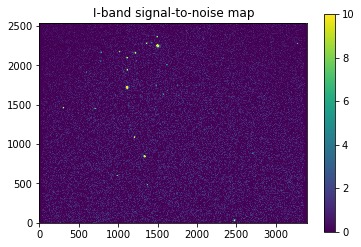

In [109]:
flat_noise_iband = (med_flat_iband/len(iband_flat_dsub) + median_readnoise**2)**0.5 / med_flat_iband
iband_error = (
    (iband_dsub + median_readnoise**2)/(norm_med_flat_iband**2) +
    (flat_noise_iband**2 * iband_dsub**2) /(norm_med_flat_iband**4)
)**0.5
iband_error_padded = [np.pad(array=data, mode='constant',
                             pad_width=[(max_shift[0], max_shift[0]), (max_shift[1], max_shift[1])])
                      for data in iband_error]
iband_error_aligned = np.array([shift(input=data, shift=-sxy, order=0)
                                 for (data, sxy) in zip(iband_error_padded, shiftyx)])
iband_final_error = ((iband_error_aligned**2).sum(axis=0) / iband_error_aligned.shape[0])**0.5
iband_signal_to_noise = iband_median_aligned / iband_final_error
_=pl.imshow(iband_signal_to_noise, vmin=0, vmax=10)
_=pl.colorbar()
_=pl.title("I-band signal-to-noise map")

## U Band
Bad data so I'm skipping it.

## SI II Band

In [110]:
sband_flat_dsub = np.array([fits.getdata(fn) - master_dark
                      for fn in flatfilenames
                      if fits.getheader(fn)['FILTER'] == 'SI II'
                     ])
sband_flat_dsub.mean(axis=(1,2))

array([ 929.30961939, 1735.94551795, 1698.33970918, 1656.56473046,
       1610.74005857])

C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


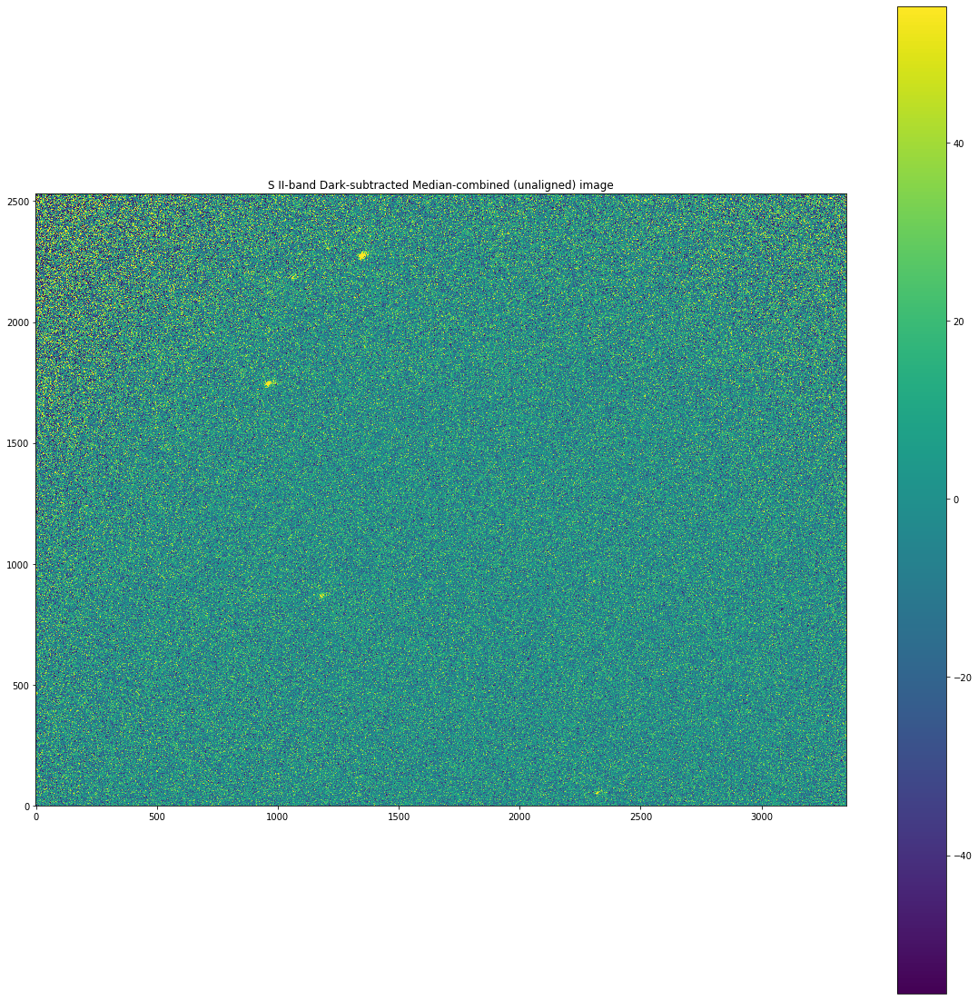

In [111]:
sband_flat_dsub = sband_flat_dsub[[1,2,3,4]]
med_flat_sband = np.median(sband_flat_dsub, axis=0)
norm_med_flat_sband = med_flat_sband / np.nanmean(med_flat_sband)
sband = np.array([fits.getdata(fn) for fn in ngc6910_2_fn_dict['SI II']])
sband_dsub = sband - master_dark
sband_dsub_flat = sband_dsub / norm_med_flat_sband
pl.figure(figsize=(20,20))
sband_dsub_median_flat_check = np.median(sband_dsub_flat, axis=0)
_=pl.imshow(sband_dsub_median_flat_check, norm=simple_norm(sband_dsub_median_flat_check, min_percent=0.5, max_percent=99.5))
_=pl.colorbar()
_=pl.title("S II-band Dark-subtracted Median-combined (unaligned) image")

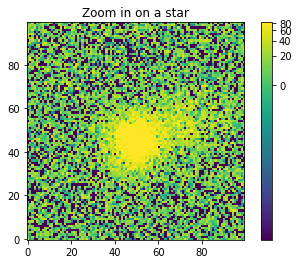

In [112]:
_=pl.imshow(sband_dsub_median_flat_check[2225:2325, 1300:1400],
            norm=simple_norm(sband_dsub_median_flat_check, stretch='log', min_percent=25, max_percent=99.95))
_=pl.colorbar()
_=pl.title("Zoom in on a star")

47.47744039029603 40.61551111393342
45.74825453545904 44.57515576323988
52.14437927348458 46.88552359977147
63.39245492358829 51.52997975971626
80.32648848027746 55.876453154963436


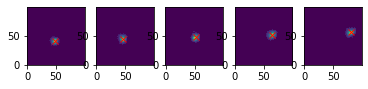

In [113]:
stddev = np.nanstd(sband_dsub)
m1s = []
for ii,img in enumerate(sband_dsub):
    pl.subplot(1,5,ii+1)
    mask = img > (6 * stddev)
    masked_image = (img * mask)
    cutout = masked_image[2225:2325, 1300:1400]
    pl.imshow(cutout)
    mom1x, mom1y = xycentroid(cutout)
    pl.plot(mom1x, mom1y, 'rx')
    print(mom1x, mom1y)
    m1s.append([mom1x, mom1y])

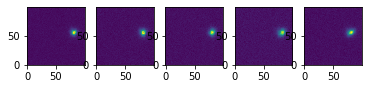

In [114]:
refx, refy = np.mean(m1s, axis=0)
shiftxy = np.array(m1s) - np.array([refx, refy])
shiftyx = shiftxy[:,::-1]
max_shift = np.ceil(np.abs(shiftyx).max(axis=0)).astype('int')
sband_dsub_padded = [np.pad(array=data, mode='constant',
                            pad_width=[(max_shift[0], max_shift[0]), (max_shift[1], max_shift[1])])
                     for data in sband_dsub]
sband_dsub_aligned = [shift(input=data, shift=-sxy, order=0)
                       for (data, sxy) in zip(sband_dsub_padded, shiftyx)]
for ii,img in enumerate(sband_dsub_aligned):
    pl.subplot(1,5,ii+1)
    pl.imshow(img[2225:2325, 1300:1400])

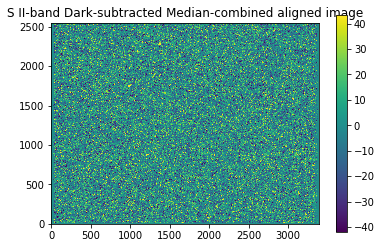

In [115]:
sband_median_aligned = np.median(sband_dsub_aligned, axis=0)
_=pl.imshow(sband_median_aligned, norm=simple_norm(sband_median_aligned, min_percent=0.5, max_percent=99.5))
_=pl.colorbar()
_=pl.title("S II-band Dark-subtracted Median-combined aligned image")

C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in multiply
  after removing the cwd from sys.path.
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in sqrt
  """
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':


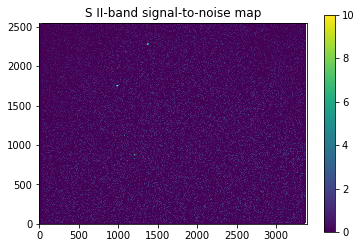

In [116]:
flat_noise_sband = (med_flat_sband/len(sband_flat_dsub) + median_readnoise**2)**0.5 / med_flat_sband
sband_error = (
    (sband_dsub + median_readnoise**2)/(norm_med_flat_sband**2) +
    (flat_noise_sband**2 * sband_dsub**2) /(norm_med_flat_sband**4)
)**0.5
sband_error_padded = [np.pad(array=data, mode='constant',
                             pad_width=[(max_shift[0], max_shift[0]), (max_shift[1], max_shift[1])])
                      for data in sband_error]
sband_error_aligned = np.array([shift(input=data, shift=-sxy, order=0)
                                 for (data, sxy) in zip(sband_error_padded, shiftyx)])
sband_final_error = ((sband_error_aligned**2).sum(axis=0) / sband_error_aligned.shape[0])**0.5
sband_signal_to_noise = sband_median_aligned / sband_final_error
_=pl.imshow(sband_signal_to_noise, vmin=0, vmax=10)
_=pl.colorbar()
_=pl.title("S II-band signal-to-noise map")

## O III Band

In [117]:
oband_flat_dsub = np.array([fits.getdata(fn) - master_dark
                      for fn in flatfilenames
                      if fits.getheader(fn)['FILTER'] == 'O III'
                     ])
oband_flat_dsub.mean(axis=(1,2))

array([ 751.3158069 , 1518.91559359, 1507.60812843, 1491.13053965,
       1470.5870221 ])

C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


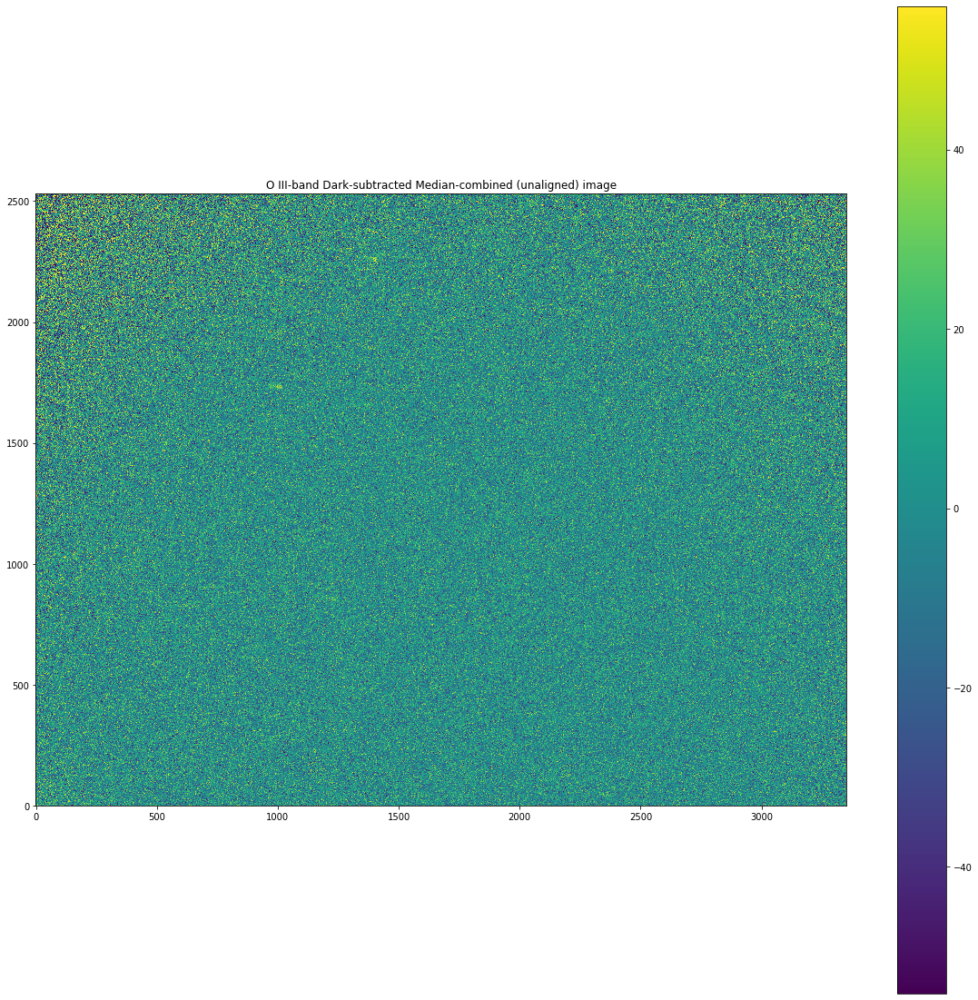

In [118]:
oband_flat_dsub = oband_flat_dsub[[1,2,3,4]]
med_flat_oband = np.median(oband_flat_dsub, axis=0)
norm_med_flat_oband = med_flat_oband / np.nanmean(med_flat_oband)
oband = np.array([fits.getdata(fn) for fn in ngc6910_2_fn_dict['O III']])
oband_dsub = oband - master_dark
oband_dsub_flat = oband_dsub / norm_med_flat_oband

oband_dsub_median_flat_check = np.median(oband_dsub_flat, axis=0)
pl.figure(figsize=(20,20))
_=pl.imshow(oband_dsub_median_flat_check, norm=simple_norm(oband_dsub_median_flat_check, min_percent=0.5, max_percent=99.5))
_=pl.colorbar()
_=pl.title("O III-band Dark-subtracted Median-combined (unaligned) image")

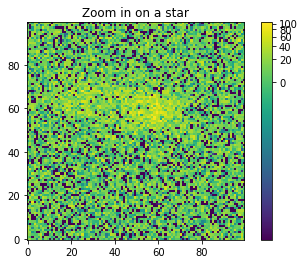

In [119]:
_=pl.imshow(oband_dsub_median_flat_check[2200:2300, 1340:1440],
            norm=simple_norm(oband_dsub_median_flat_check, stretch='log', min_percent=15, max_percent=99.995))
_=pl.colorbar()
_=pl.title("Zoom in on a star")

65.21008325366846 56.356431508311445
57.1396529470816 59.15329604665615
50.85036136495319 60.34372871707818
34.599275354902105 62.56929674626163
20.74975180356079 64.70031107287048


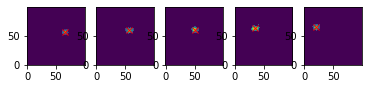

In [120]:
stddev = np.nanstd(oband_dsub)
m1s = []
for ii,img in enumerate(oband_dsub):
    pl.subplot(1,5,ii+1)
    mask = img > (6 * stddev)
    masked_image = (img * mask)
    cutout = masked_image[2200:2300, 1340:1440]
    pl.imshow(cutout)
    mom1x, mom1y = xycentroid(cutout)
    pl.plot(mom1x, mom1y, 'rx')
    print(mom1x, mom1y)
    m1s.append([mom1x, mom1y])

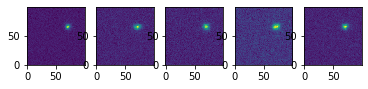

In [121]:
refx, refy = np.mean(m1s, axis=0)
shiftxy = np.array(m1s) - np.array([refx, refy])
shiftyx = shiftxy[:,::-1]
max_shift = np.ceil(np.abs(shiftyx).max(axis=0)).astype('int')
oband_dsub_padded = [np.pad(array=data, mode='constant',
                            pad_width=[(max_shift[0], max_shift[0]), (max_shift[1], max_shift[1])])
                     for data in oband_dsub]
oband_dsub_aligned = [shift(input=data, shift=-sxy, order=0)
                       for (data, sxy) in zip(oband_dsub_padded, shiftyx)]

for ii,img in enumerate(oband_dsub_aligned):
    pl.subplot(1,5,ii+1)
    pl.imshow(img[2200:2300, 1340:1440])

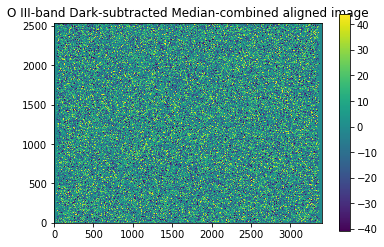

In [122]:
oband_median_aligned = np.median(oband_dsub_aligned, axis=0)
_=pl.imshow(oband_median_aligned, norm=simple_norm(oband_median_aligned, min_percent=0.5, max_percent=99.5))
_=pl.colorbar()
_=pl.title("O III-band Dark-subtracted Median-combined aligned image")

C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in multiply
  after removing the cwd from sys.path.
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':


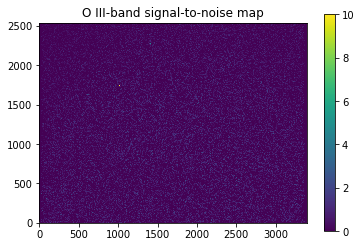

In [123]:
flat_noise_oband = (med_flat_oband/len(oband_flat_dsub) + median_readnoise**2)**0.5 / med_flat_oband
oband_error = (
    (oband_dsub + median_readnoise**2)/(norm_med_flat_oband**2) +
    (flat_noise_oband**2 * oband_dsub**2) /(norm_med_flat_oband**4)
)**0.5
oband_error_padded = [np.pad(array=data, mode='constant',
                             pad_width=[(max_shift[0], max_shift[0]), (max_shift[1], max_shift[1])])
                      for data in oband_error]
oband_error_aligned = np.array([shift(input=data, shift=-sxy, order=0)
                                 for (data, sxy) in zip(oband_error_padded, shiftyx)])
oband_final_error = ((oband_error_aligned**2).sum(axis=0) / oband_error_aligned.shape[0])**0.5
oband_signal_to_noise = oband_median_aligned / oband_final_error
_=pl.imshow(oband_signal_to_noise, vmin=0, vmax=10)
_=pl.colorbar()
_=pl.title("O III-band signal-to-noise map")

## B Band

In [124]:
bband_flat_dsub = np.array([fits.getdata(fn) - master_dark
                      for fn in flatfilenames
                      if fits.getheader(fn)['FILTER'] == 'B'
                     ])
bband_flat_dsub.mean(axis=(1,2))

array([7579.47286128, 7615.36403386, 7629.58764986, 7641.45644574])

C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


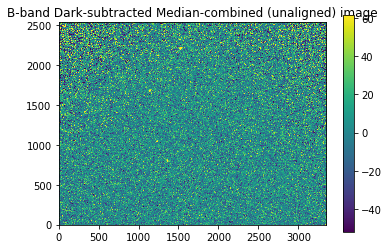

In [125]:
bband_flat_dub = bband_flat_dsub
med_flat_bband = np.median(bband_flat_dsub, axis=0)
norm_med_flat_bband = med_flat_bband / np.nanmean(med_flat_bband)
bband = np.array([fits.getdata(fn) for fn in ngc6910_2_fn_dict['B']])
bband_dsub = bband - master_dark
bband_dsub_flat = bband_dsub / norm_med_flat_bband

bband_dsub_median_flat_check = np.median(bband_dsub_flat, axis=0)
_=pl.imshow(bband_dsub_median_flat_check, norm=simple_norm(bband_dsub_median_flat_check, min_percent=0.5, max_percent=99.5))
_=pl.colorbar()
_=pl.title("B-band Dark-subtracted Median-combined (unaligned) image")

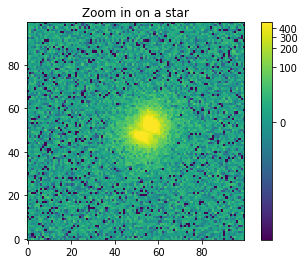

In [126]:
_=pl.imshow(bband_dsub_median_flat_check[750:850, 1300:1400],
            norm=simple_norm(bband_dsub_median_flat_check, stretch='log', min_percent=10, max_percent=99.995))
_=pl.colorbar()
_=pl.title("Zoom in on a star")

50.86641645680801 43.31786051124486
49.487837641111156 45.43718320297508
54.016547448096304 50.71221129198932
58.33883408130421 52.13405251933167
57.57266205401269 55.00898510984281


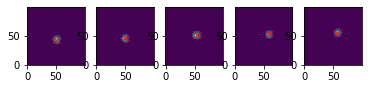

In [127]:
stddev = np.nanstd(bband_dsub)
m1s = []
for ii,img in enumerate(bband_dsub):
    pl.subplot(1,5,ii+1)
    mask = img > (6 * stddev)
    masked_image = (img * mask)
    cutout = masked_image[750:850, 1300:1400]
    pl.imshow(cutout)
    mom1x, mom1y = xycentroid(cutout)
    pl.plot(mom1x, mom1y, 'rx')
    print(mom1x, mom1y)
    m1s.append([mom1x, mom1y])

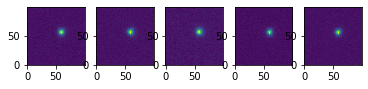

In [128]:
refx, refy = np.mean(m1s, axis=0)
shiftxy = np.array(m1s) - np.array([refx, refy])
shiftyx = shiftxy[:,::-1]
max_shift = np.ceil(np.abs(shiftyx).max(axis=0)).astype('int')
bband_dsub_padded = [np.pad(array=data, mode='constant',
                            pad_width=[(max_shift[0], max_shift[0]), (max_shift[1], max_shift[1])])
                     for data in bband_dsub]
bband_dsub_aligned = [shift(input=data, shift=-sxy, order=0)
                       for (data, sxy) in zip(bband_dsub_padded, shiftyx)]

for ii,img in enumerate(bband_dsub_aligned):
    pl.subplot(1,5,ii+1)
    pl.imshow(img[750:850, 1300:1400])

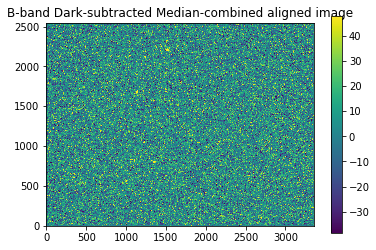

In [129]:
bband_median_aligned = np.median(bband_dsub_aligned, axis=0)
_=pl.imshow(bband_median_aligned, norm=simple_norm(bband_median_aligned, min_percent=0.5, max_percent=99.5))
_=pl.colorbar()
_=pl.title("B-band Dark-subtracted Median-combined aligned image")

C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in multiply
  after removing the cwd from sys.path.
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in sqrt
  """
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':


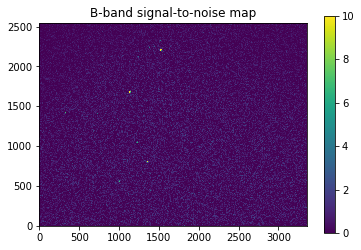

In [130]:
flat_noise_bband = (med_flat_bband/len(bband_flat_dsub) + median_readnoise**2)**0.5 / med_flat_bband
bband_error = (
    (bband_dsub + median_readnoise**2)/(norm_med_flat_bband**2) +
    (flat_noise_bband**2 * bband_dsub**2) /(norm_med_flat_bband**4)
)**0.5
bband_error_padded = [np.pad(array=data, mode='constant',
                             pad_width=[(max_shift[0], max_shift[0]), (max_shift[1], max_shift[1])])
                      for data in bband_error]
bband_error_aligned = np.array([shift(input=data, shift=-sxy, order=0)
                                 for (data, sxy) in zip(bband_error_padded, shiftyx)])
bband_final_error = ((bband_error_aligned**2).sum(axis=0) / bband_error_aligned.shape[0])**0.5
bband_signal_to_noise = bband_median_aligned / bband_final_error
_=pl.imshow(bband_signal_to_noise, vmin=0, vmax=10)
_=pl.colorbar()
_=pl.title("B-band signal-to-noise map")

## R Band

In [131]:
rband_flat_dsub = np.array([fits.getdata(fn) - master_dark
                      for fn in flatfilenames
                      if fits.getheader(fn)['FILTER'] == 'R'
                     ])
rband_flat_dsub.mean(axis=(1,2))

array([ 7887.705713  , 15878.42608166, 15882.89364505, 15879.99927485,
       15878.49095828])

C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


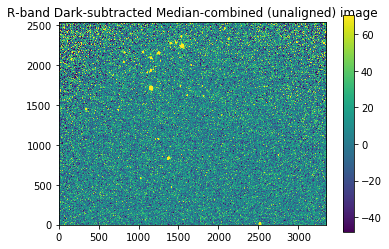

In [132]:
rband_flat_dsub = rband_flat_dsub[[1,2,3,4]]
med_flat_rband = np.median(rband_flat_dsub, axis=0)
norm_med_flat_rband = med_flat_rband / np.nanmean(med_flat_rband)
rband = np.array([fits.getdata(fn) for fn in ngc6910_2_fn_dict['R']])
rband_dsub = rband - master_dark
rband_dsub_flat = rband_dsub / norm_med_flat_rband

rband_dsub_median_flat_check = np.median(rband_dsub_flat, axis=0)
_=pl.imshow(rband_dsub_median_flat_check, norm=simple_norm(rband_dsub_median_flat_check, min_percent=0.5, max_percent=99.5))
_=pl.colorbar()
_=pl.title("R-band Dark-subtracted Median-combined (unaligned) image")

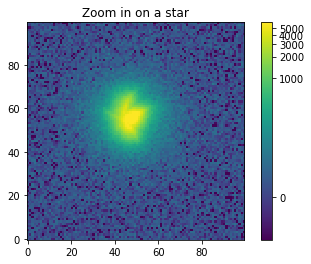

In [133]:
_=pl.imshow(rband_dsub_median_flat_check[775:875, 1325:1425],
            norm=simple_norm(rband_dsub_median_flat_check, stretch='log', min_percent=10, max_percent=99.995))
_=pl.colorbar()
_=pl.title("Zoom in on a star")

41.80600456456771 49.404918681376174
48.95509874744664 52.85318428148842
48.93890642129691 56.40908314328902
46.80057390580524 58.699476616360016
39.662692077880564 60.33130905019256


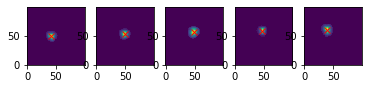

In [134]:
stddev = np.nanstd(rband_dsub)
m1s = []
for ii,img in enumerate(rband_dsub):
    pl.subplot(1,5,ii+1)
    mask = img > (6 * stddev)
    masked_image = (img * mask)
    cutout = masked_image[775:875, 1325:1425]
    pl.imshow(cutout)
    mom1x, mom1y = xycentroid(cutout)
    pl.plot(mom1x, mom1y, 'rx')
    print(mom1x, mom1y)
    m1s.append([mom1x, mom1y])

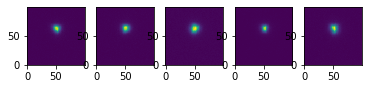

In [135]:
refx, refy = np.mean(m1s, axis=0)
shiftxy = np.array(m1s) - np.array([refx, refy])
shiftyx = shiftxy[:,::-1]
max_shift = np.ceil(np.abs(shiftyx).max(axis=0)).astype('int')
rband_dsub_padded = [np.pad(array=data, mode='constant',
                            pad_width=[(max_shift[0], max_shift[0]), (max_shift[1], max_shift[1])])
                     for data in rband_dsub]
rband_dsub_aligned = [shift(input=data, shift=-sxy, order=0)
                       for (data, sxy) in zip(rband_dsub_padded, shiftyx)]

for ii,img in enumerate(rband_dsub_aligned):
    pl.subplot(1,5,ii+1)
    pl.imshow(img[775:875, 1325:1425])

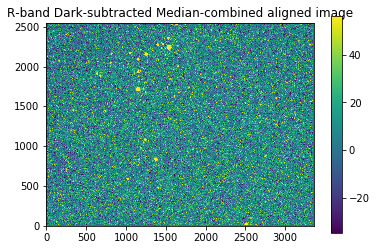

In [136]:
rband_median_aligned = np.median(rband_dsub_aligned, axis=0)
_=pl.imshow(rband_median_aligned, norm=simple_norm(rband_median_aligned, min_percent=0.5, max_percent=99.5))
_=pl.colorbar()
_=pl.title("R-band Dark-subtracted Median-combined aligned image")

C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in multiply
  after removing the cwd from sys.path.
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in sqrt
  """
C:\Users\mjfer\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':


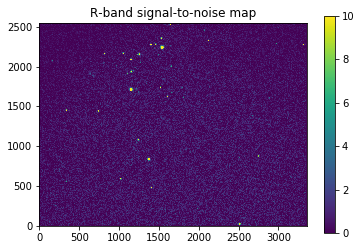

In [137]:
flat_noise_rband = (med_flat_rband/len(rband_flat_dsub) + median_readnoise**2)**0.5 / med_flat_rband
rband_error = (
    (rband_dsub + median_readnoise**2)/(norm_med_flat_rband**2) +
    (flat_noise_rband**2 * rband_dsub**2) /(norm_med_flat_rband**4)
)**0.5
rband_error_padded = [np.pad(array=data, mode='constant',
                             pad_width=[(max_shift[0], max_shift[0]), (max_shift[1], max_shift[1])])
                      for data in rband_error]
rband_error_aligned = np.array([shift(input=data, shift=-sxy, order=0)
                                 for (data, sxy) in zip(rband_error_padded, shiftyx)])
rband_final_error = ((rband_error_aligned**2).sum(axis=0) / rband_error_aligned.shape[0])**0.5
rband_signal_to_noise = rband_median_aligned / rband_final_error
_=pl.imshow(rband_signal_to_noise, vmin=0, vmax=10)
_=pl.colorbar()
_=pl.title("R-band signal-to-noise map")

# Photometry

[Index](#Index)

The next step is photometry.

We'll use pre-defined automated photometry tools to extract the best photometry we can.

https://photutils.readthedocs.io/en/stable/api/photutils.detection.DAOStarFinder.html#photutils.detection.DAOStarFinder

In [138]:
from photutils import DAOStarFinder

In [139]:
# Estimate our typical error
vband_error_estimate = np.nanmedian(vband_final_error)

In [140]:
# the choice of fwhm=2 pixels and threshold = 5 sigma are somewhat arbitrary
# the documentation above uses fwhm=3, threshold=5-sigma
daofind = DAOStarFinder(fwhm=2.0, threshold=5.*vband_error_estimate)  

In [141]:
sources_vband = daofind(vband_median_aligned)

In [142]:
sources_vband

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64
1,2512.846477032809,8.33122882673177,0.4591395583130978,-0.20870561181021335,-0.7769013329699791,25,0.0,6851.0,21.943514063811136,-3.3532654432741205
2,1401.6441530092216,463.4387698765727,0.8830670103092779,0.1958764581480676,-0.5599337986615812,25,0.0,843.0,1.0996956242789941,-0.10318124246810254
3,1405.35135132721,463.8786153293495,0.4436398160991541,-0.19061885487514854,0.14176718025998075,25,0.0,1230.5,2.7640597008822376,-1.1038685478079633
4,1018.6933321772306,577.6978975192729,0.5712814996926858,0.21983704670457682,-0.8189454837932786,25,0.0,1594.0,2.1799121039479847,-0.8460974570161662
5,1022.188430983094,577.8979764096089,0.6103668834993143,-0.08530714198673546,0.2158210293508852,25,0.0,2497.0,5.424952080311497,-1.8359897658183735
6,1371.1482695182176,821.6423034415018,0.5612283407859657,-0.15230740706562618,0.24897513735424842,25,0.0,13529.0,23.970684938594978,-3.4492011093647266
7,2747.909222513663,861.5418695727294,0.6744862186571421,0.3040927369259088,0.02538890221248467,25,0.0,848.5,1.4082081717688475,-0.37166715045236054
8,2747.1831282673365,863.6712928992222,0.7763797783306939,-0.2146751174217103,0.46206292229379947,25,0.0,706.0,1.1846824107626357,-0.18400485109865747
9,1238.716323698849,1066.6482127729644,0.9956490184749364,-0.07857856707353758,-0.417334522396925,25,0.0,2355.5,2.925417101947956,-1.1654694898575209


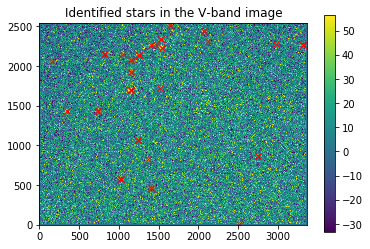

In [143]:
_=pl.imshow(vband_median_aligned, norm=simple_norm(vband_median_aligned, min_percent=0.5, max_percent=99.5))
_=pl.plot(sources_vband['xcentroid'], sources_vband['ycentroid'], 'rx')
_=pl.colorbar()
_=pl.title("Identified stars in the V-band image")

Repeat for H-alpha.  The H-alpha filter lets through much less light, so we can only detect the brightest stars in H-alpha.

In [144]:
halpha_error_estimate = np.nanmedian(halpha_final_error)

In [145]:
daofind = DAOStarFinder(fwhm=2.0, threshold=5.*halpha_error_estimate)

In [146]:
sources_halpha = daofind(halpha_median_aligned)

In [147]:
sources_halpha

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64
1,1291.1363050635475,852.5905980356065,0.5744114854213469,0.5477017718545387,0.41909698581493604,25,0.0,629.0,1.6662663681686936,-0.5543610715768108
2,1069.4286816288832,1728.2752705629057,0.5518187111922124,0.23815267122251063,0.22458058187795743,25,0.0,1483.0,3.3209710653493856,-1.303162729334837
3,1458.6463058270017,2255.980869586104,0.5758547601914408,0.5874015495054605,0.5857027333156246,25,0.0,1858.5,4.282595986487319,-1.5792677641403468


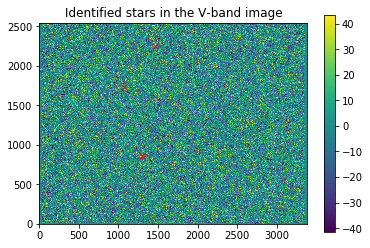

In [148]:
_=pl.imshow(halpha_median_aligned, norm=simple_norm(halpha_median_aligned, min_percent=0.5, max_percent=99.5))
_=pl.plot(sources_halpha['xcentroid'], sources_halpha['ycentroid'], 'rx')
_=pl.colorbar()
_=pl.title("Identified stars in the V-band image")

We want to compare these images, though, so we have to align them first.

The bottom of the three h-alpha stars is also seen in the V-band image.

In h-alpha, it has coordinates x=1291.1, y=852.59 (which you can tell just by looking at the image).

In the V-band, it's a little tricker, but it's not *too* far from there.  You have to figure out which star it is in the table.  Do that by selecting a box in the table and only looking at stars in that box:

In [149]:
yy = sources_vband['ycentroid']
xx = sources_vband['xcentroid']
in_box = (xx>1000) & (xx<1500) & (yy>500) & (yy<1000)
sources_vband[in_box]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64
4,1018.6933321772306,577.6978975192729,0.5712814996926858,0.21983704670457682,-0.8189454837932786,25,0.0,1594.0,2.1799121039479847,-0.8460974570161662
5,1022.188430983094,577.8979764096089,0.6103668834993143,-0.08530714198673546,0.2158210293508852,25,0.0,2497.0,5.424952080311497,-1.8359897658183735
6,1371.1482695182176,821.6423034415018,0.5612283407859657,-0.15230740706562618,0.24897513735424842,25,0.0,13529.0,23.970684938594978,-3.4492011093647266


You can see there are now only three stars, and the one we want is the brightest of the three (since that's the one that we can see in H-alpha).

Look at the "peak" column to see which is brightest - it's the star with id=6

In [150]:
halpha_star = sources_halpha[sources_halpha['id'] == 1]
vband_star = sources_vband[sources_vband['id'] == 6]
halpha_star, vband_star

(<Table length=1>
   id      xcentroid      ...        flux                mag        
 int32      float64       ...      float64             float64      
 ----- ------------------ ... ------------------ -------------------
     1 1291.1363050635475 ... 1.6662663681686936 -0.5543610715768108,
 <Table length=1>
   id      xcentroid      ...        flux                mag        
 int32      float64       ...      float64             float64      
 ----- ------------------ ... ------------------ -------------------
     6 1371.1482695182176 ... 23.970684938594978 -3.4492011093647266)

We can calculate the shift between the catalogs...

In [151]:
dx = halpha_star['xcentroid'] - vband_star['xcentroid']
dy = halpha_star['ycentroid'] - vband_star['ycentroid']

Then we can modify the centroids of one catalog to match the other

In [152]:
sources_vband['xcentroid'] = sources_vband['xcentroid'] + dx
sources_vband['ycentroid'] = sources_vband['ycentroid'] + dy

Let's check that that star is now the same in H-alpha and V-band:

In [153]:
halpha_star = sources_halpha[sources_halpha['id'] == 1]
vband_star = sources_vband[sources_vband['id'] == 6]
halpha_star['xcentroid', 'ycentroid'], vband_star['xcentroid', 'ycentroid']

(<Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065, <Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065)

Now that we have these coordinates, we can cross-match the catalogs.  We use a special tool to speed this up called a "KDTree"

In [154]:
from scipy.spatial import KDTree

In [155]:
xx = np.array(sources_vband['xcentroid'])
yy = np.array(sources_vband['ycentroid'])
xy_vband = np.array([xx,yy]).T
kdt = KDTree(xy_vband)

The kdtree lets us search for the nearest neighbor quickly.  We'll do this once for each row in the H-alpha table, and we'll add the result at the end of that table.

In [156]:
sources_halpha.add_column(col=np.zeros(len(sources_halpha), dtype='int'), name='vband_match_number')

In [157]:
for row in sources_halpha:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdt.query(xy)
    row['vband_match_number'] = index

In [158]:
sources_halpha

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag,vband_match_number
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32
1,1291.1363050635475,852.5905980356065,0.5744114854213469,0.5477017718545387,0.41909698581493604,25,0.0,629.0,1.6662663681686936,-0.5543610715768108,5
2,1069.4286816288832,1728.2752705629057,0.5518187111922124,0.23815267122251063,0.22458058187795743,25,0.0,1483.0,3.3209710653493856,-1.303162729334837,18
3,1458.6463058270017,2255.980869586104,0.5758547601914408,0.5874015495054605,0.5857027333156246,25,0.0,1858.5,4.282595986487319,-1.5792677641403468,32


Now we can add the V-band fluxes, too:

In [159]:
sources_halpha.rename_column('peak', 'peak_ha')
sources_halpha.rename_column('flux', 'flux_ha')
sources_halpha.rename_column('mag', 'mag_ha')

indices = sources_halpha['vband_match_number']
sources_halpha.add_column(col=sources_vband['peak'][indices], name='peak_vband')
sources_halpha.add_column(col=sources_vband['mag'][indices], name='mag_vband')
sources_halpha.add_column(col=sources_vband['flux'][indices], name='flux_vband')

Now, finally, we can make a color-magnitude diagram (albeit with only 3 sources)

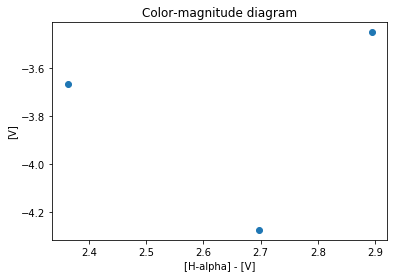

In [160]:
_=pl.plot(sources_halpha['mag_ha'] - sources_halpha['mag_vband'], sources_halpha['mag_vband'], 'o')
_=pl.title("Color-magnitude diagram")
_=pl.xlabel('[H-alpha] - [V]')
_=pl.ylabel('[V]')

Note that the V-band filter has a lot of stars that aren't in the H-ALPHA filter.  We want to attach H-alpha sources to the V-band catalog too, so let's do that.

This is going to reveal some problems: there are a lot more stars in V-band than H-alpha,  so each V-band source can have multiple matches in H-ALPHA

In [161]:
xx = np.array(sources_halpha['xcentroid'])
yy = np.array(sources_halpha['ycentroid'])
xy_halpha = np.array([xx,yy]).T
kdt_halpha = KDTree(xy_halpha)

In [162]:
sources_vband.add_column(col=np.zeros(len(sources_vband), dtype='int'), name='halpha_match_number')
sources_vband.add_column(col=np.zeros(len(sources_vband), dtype='float'), name='halpha_match_separation')

In [163]:
# we want to track the separation too....
for row in sources_vband:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdt_halpha.query(xy)
    row['halpha_match_number'] = index
    row['halpha_match_separation'] = matchdistance

In [164]:
sources_vband.rename_column('peak', 'peak_vband')
sources_vband.rename_column('flux', 'flux_vband')
sources_vband.rename_column('mag', 'mag_vband')

indices = sources_vband['halpha_match_number']
# note that we already renamed the H-alpha columns
sources_vband.add_column(col=sources_halpha['peak_ha'][indices], name='peak_ha')
sources_vband.add_column(col=sources_halpha['mag_ha'][indices], name='mag_ha')
sources_vband.add_column(col=sources_halpha['flux_ha'][indices], name='flux_ha')

In [165]:
# look at the table
sources_vband

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_vband,flux_vband,mag_vband,halpha_match_number,halpha_match_separation,peak_ha,mag_ha,flux_ha
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,float64
1,2432.834512578139,39.27952342083648,0.4591395583130978,-0.20870561181021335,-0.7769013329699791,25,0.0,6851.0,21.943514063811136,-3.3532654432741205,0,1401.7666357611251,629.0,-0.5543610715768108,1.6662663681686936
2,1321.6321885545515,494.3870644706774,0.8830670103092779,0.1958764581480676,-0.5599337986615812,25,0.0,843.0,1.0996956242789941,-0.10318124246810254,0,359.4993329177374,629.0,-0.5543610715768108,1.6662663681686936
3,1325.33938687254,494.8269099234542,0.4436398160991541,-0.19061885487514854,0.14176718025998075,25,0.0,1230.5,2.7640597008822376,-1.1038685478079633,0,359.3949183514453,629.0,-0.5543610715768108,1.6662663681686936
4,938.6813677225605,608.6461921133777,0.5712814996926858,0.21983704670457682,-0.8189454837932786,25,0.0,1594.0,2.1799121039479847,-0.8460974570161662,0,428.6412906344748,629.0,-0.5543610715768108,1.6662663681686936
5,942.1764665284239,608.8462710037136,0.6103668834993143,-0.08530714198673546,0.2158210293508852,25,0.0,2497.0,5.424952080311497,-1.8359897658183735,0,425.65745132757854,629.0,-0.5543610715768108,1.6662663681686936
6,1291.1363050635475,852.5905980356065,0.5612283407859657,-0.15230740706562618,0.24897513735424842,25,0.0,13529.0,23.970684938594978,-3.4492011093647266,0,0.0,629.0,-0.5543610715768108,1.6662663681686936
7,2667.8972580589925,892.4901641668341,0.6744862186571421,0.3040927369259088,0.02538890221248467,25,0.0,848.5,1.4082081717688475,-0.37166715045236054,0,1377.338991341778,629.0,-0.5543610715768108,1.6662663681686936
8,2667.1711638126662,894.6195874933269,0.7763797783306939,-0.2146751174217103,0.46206292229379947,25,0.0,706.0,1.1846824107626357,-0.18400485109865747,0,1376.676566390067,629.0,-0.5543610715768108,1.6662663681686936
9,1158.704359244179,1097.596507367069,0.9956490184749364,-0.07857856707353758,-0.417334522396925,25,0.0,2355.5,2.925417101947956,-1.1654694898575209,0,278.5069404536286,629.0,-0.5543610715768108,1.6662663681686936


You can now see in the `halpha_match_separation` column there are a lot of very far apart sources!  We don't want to include "matches" where the closest source is 100 pixels away.  We can actually filter down to select only the *closest* match in each by using the `match_number`:

In [166]:
# let's get all the unique H-alpha catalog star IDs - for each H-alpha star, we only want there to be one V-band match
halpha_match_numbers = np.unique(sources_vband['halpha_match_number'])
halpha_match_numbers

0
1
2


For each of those IDs, we're going to "get rid of" all but the closest match.  We'll also keep track of which have good matches.

In [167]:
# add a new column that answers, "Did we match to H-alpha in this row?"
# We default to answering *yes*, but will change most of the answers to *no* (False) in the next step
sources_vband.add_column(col=np.ones(len(sources_vband), dtype='bool'), name='halpha_matched')

The logic in this next cell is pretty tricky, but really useful:

* `selection = sources_vband['halpha_match_number'] == idnumber` This line creates a "boolean mask array" that is True wherever the matched H-alpha row `idnumber` is the same as the `halpha_match_number` column.  This selects all V-band sources that are matched to a specific H-alpha source
* `separations = sources_vband['halpha_match_separation'][selection]` This grabs the separation between the V-band source and the closest-match H-alpha source that we stored above.  Only one H-alpha source is chosen here because of the first step
* `closest = np.where(selection)[0][np.argmin(separations)]` gets us the index of the smallest separation.  This is where things get tricky: `separations` is a subset of (a smaller array than) all of the separations, so we need to get the index number from the *original* `separations` array.
* `selection[closest] = False` says that, of the selections we made above - which is all V-band sources that had a specific H-alpha match - we want to get the one that's closest and set it to False - which means we want to *keep* it, since we're going to "flag out" the rest.
* The rest of the lines simply take this selection and set the values to `nan` so we don't have to look at them any more.

This is pretty tricky logic.  See if you can follow it, but you can most likely just reuse it.  Refer back to this description if you encounter trouble!

In [168]:
for idnumber in halpha_match_numbers:
    selection = sources_vband['halpha_match_number'] == idnumber
    separations = sources_vband['halpha_match_separation'][selection]
    closest = np.where(selection)[0][np.argmin(separations)]
    selection[closest] = False
    for ha_col in ('peak_ha', 'mag_ha', 'flux_ha'):
        sources_vband[ha_col][selection] = np.nan
    sources_vband['halpha_matched'][selection] = False

Look at the table.  You probably have to scroll right to see the new stuff.

In [169]:
sources_vband

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_vband,flux_vband,mag_vband,halpha_match_number,halpha_match_separation,peak_ha,mag_ha,flux_ha,halpha_matched
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,float64,bool
1,2432.834512578139,39.27952342083648,0.4591395583130978,-0.20870561181021335,-0.7769013329699791,25,0.0,6851.0,21.943514063811136,-3.3532654432741205,0,1401.7666357611251,nan,nan,nan,False
2,1321.6321885545515,494.3870644706774,0.8830670103092779,0.1958764581480676,-0.5599337986615812,25,0.0,843.0,1.0996956242789941,-0.10318124246810254,0,359.4993329177374,nan,nan,nan,False
3,1325.33938687254,494.8269099234542,0.4436398160991541,-0.19061885487514854,0.14176718025998075,25,0.0,1230.5,2.7640597008822376,-1.1038685478079633,0,359.3949183514453,nan,nan,nan,False
4,938.6813677225605,608.6461921133777,0.5712814996926858,0.21983704670457682,-0.8189454837932786,25,0.0,1594.0,2.1799121039479847,-0.8460974570161662,0,428.6412906344748,nan,nan,nan,False
5,942.1764665284239,608.8462710037136,0.6103668834993143,-0.08530714198673546,0.2158210293508852,25,0.0,2497.0,5.424952080311497,-1.8359897658183735,0,425.65745132757854,nan,nan,nan,False
6,1291.1363050635475,852.5905980356065,0.5612283407859657,-0.15230740706562618,0.24897513735424842,25,0.0,13529.0,23.970684938594978,-3.4492011093647266,0,0.0,629.0,-0.5543610715768108,1.6662663681686936,True
7,2667.8972580589925,892.4901641668341,0.6744862186571421,0.3040927369259088,0.02538890221248467,25,0.0,848.5,1.4082081717688475,-0.37166715045236054,0,1377.338991341778,nan,nan,nan,False
8,2667.1711638126662,894.6195874933269,0.7763797783306939,-0.2146751174217103,0.46206292229379947,25,0.0,706.0,1.1846824107626357,-0.18400485109865747,0,1376.676566390067,nan,nan,nan,False
9,1158.704359244179,1097.596507367069,0.9956490184749364,-0.07857856707353758,-0.417334522396925,25,0.0,2355.5,2.925417101947956,-1.1654694898575209,0,278.5069404536286,nan,nan,nan,False


In [170]:
# verify that there are only 3 closest matches
sources_vband['halpha_matched'].sum()

3

In [171]:
# look at those 3 closest matches
good_halpha_matches = sources_vband['halpha_matched']
sources_vband[good_halpha_matches]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_vband,flux_vband,mag_vband,halpha_match_number,halpha_match_separation,peak_ha,mag_ha,flux_ha,halpha_matched
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,float64,bool
6,1291.1363050635475,852.5905980356065,0.5612283407859657,-0.15230740706562618,0.24897513735424842,25,0.0,13529.0,23.970684938594978,-3.4492011093647266,0,0.0,629.0,-0.5543610715768108,1.6662663681686936,True
19,1069.0393065903738,1728.319565458442,0.6178666999801389,-0.27845201546029175,-0.04614704784349982,25,0.0,23665.5,29.26707466448045,-3.6659482887830777,1,0.3918864100536289,1483.0,-1.303162729334837,3.3209710653493856,True
33,1459.878420553399,2255.1878267915827,0.5795365519918619,0.5559241309023739,0.31065429901167746,25,0.0,36413.0,51.34632435501843,-4.276273399800727,2,1.4652725251458578,1858.5,-1.5792677641403468,4.282595986487319,True


# ASSIGNMENT: Create photometric catalogs of your other filters

[Index](#Index)

Align them, then cross-match them.

Make color-color diagrams and color-magnitude diagrams.  Label them.

In [172]:
rband_error_estimate = np.nanmedian(rband_final_error)
bband_error_estimate = np.nanmedian(bband_final_error)
oband_error_estimate = np.nanmedian(oband_final_error)
sband_error_estimate = np.nanmedian(sband_final_error)
#uband_error_estimate = np.nanmedian(uband_final_error)
iband_error_estimate = np.nanmedian(iband_final_error)

In [173]:
rdaofind = DAOStarFinder(fwhm=2.0, threshold=5.*rband_error_estimate)
bdaofind = DAOStarFinder(fwhm=2.0, threshold=5.*bband_error_estimate)  
odaofind = DAOStarFinder(fwhm=2.0, threshold=5.*oband_error_estimate)  
sdaofind = DAOStarFinder(fwhm=2.0, threshold=5.*sband_error_estimate)  
#udaofind = DAOStarFinder(fwhm=2.0, threshold=5.*uband_error_estimate)  
idaofind = DAOStarFinder(fwhm=2.0, threshold=5.*iband_error_estimate)  

In [174]:
sources_rband = rdaofind(rband_median_aligned)
sources_bband = bdaofind(bband_median_aligned)
sources_oband = odaofind(oband_median_aligned)
sources_sband = sdaofind(sband_median_aligned)
#sources_uband = udaofind(uband_median_aligned)
sources_iband = idaofind(iband_median_aligned)

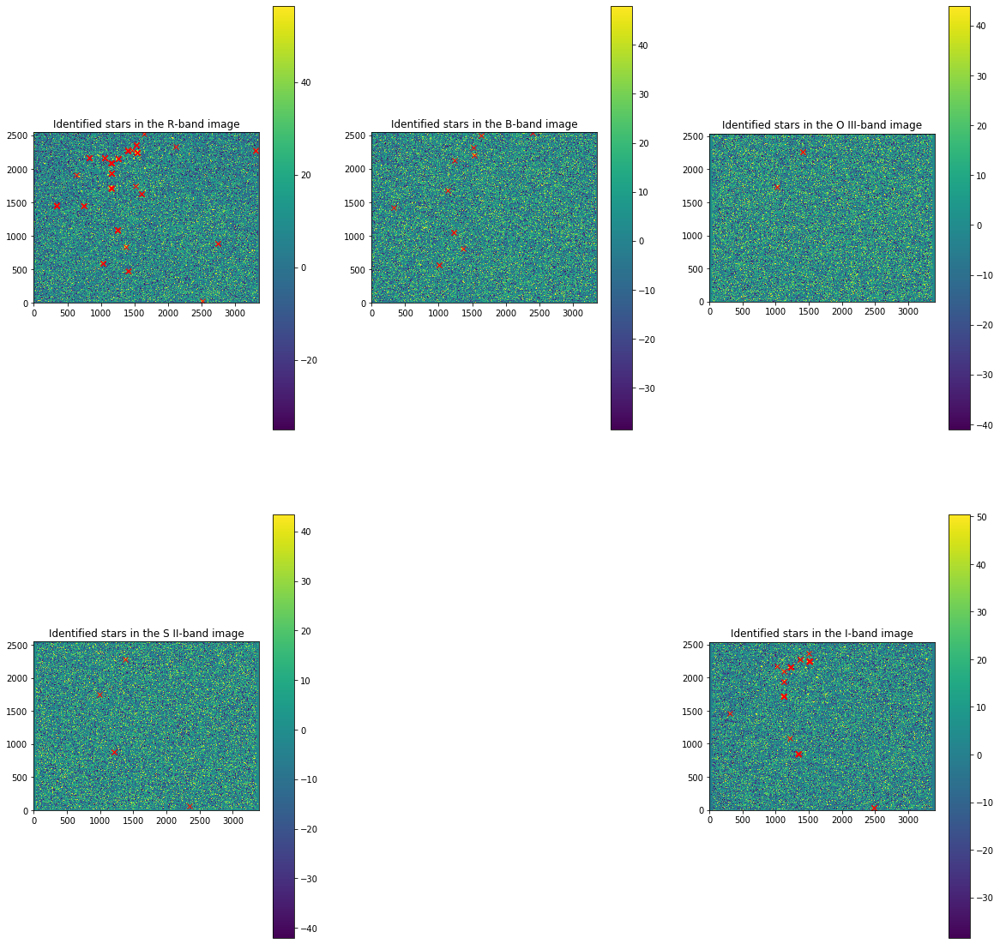

In [175]:
pl.figure(figsize=(20,20))
_=pl.subplot(2,3,1)
_=pl.imshow(rband_median_aligned, norm=simple_norm(rband_median_aligned, min_percent=0.5, max_percent=99.5))
_=pl.plot(sources_rband['xcentroid'], sources_rband['ycentroid'], 'rx')
_=pl.colorbar()
_=pl.title("Identified stars in the R-band image")

_=pl.subplot(2,3,2)
_=pl.imshow(bband_median_aligned, norm=simple_norm(bband_median_aligned, min_percent=0.5, max_percent=99.5))
_=pl.plot(sources_bband['xcentroid'], sources_bband['ycentroid'], 'rx')
_=pl.colorbar()
_=pl.title("Identified stars in the B-band image")

_=pl.subplot(2,3,3)
_=pl.imshow(oband_median_aligned, norm=simple_norm(oband_median_aligned, min_percent=0.5, max_percent=99.5))
_=pl.plot(sources_oband['xcentroid'], sources_oband['ycentroid'], 'rx')
_=pl.colorbar()
_=pl.title("Identified stars in the O III-band image")

_=pl.subplot(2,3,4)
_=pl.imshow(sband_median_aligned, norm=simple_norm(sband_median_aligned, min_percent=0.5, max_percent=99.5))
_=pl.plot(sources_sband['xcentroid'], sources_sband['ycentroid'], 'rx')
_=pl.colorbar()
_=pl.title("Identified stars in the S II-band image")

#_=pl.subplot(2,3,5)
#_=pl.imshow(uband_median_aligned, norm=simple_norm(uband_median_aligned, min_percent=0.5, max_percent=99.5))
#_=pl.plot(sources_uband['xcentroid'], sources_uband['ycentroid'], 'rx')
#_=pl.colorbar()
#_=pl.title("Identified stars in the U-band image")

_=pl.subplot(2,3,6)
_=pl.imshow(iband_median_aligned, norm=simple_norm(iband_median_aligned, min_percent=0.5, max_percent=99.5))
_=pl.plot(sources_iband['xcentroid'], sources_iband['ycentroid'], 'rx')
_=pl.colorbar()
_=pl.title("Identified stars in the I-band image")

The U band is just bad data and will be ignored.
## H-alpha v. R

In [176]:
yy = sources_rband['ycentroid']
xx = sources_rband['xcentroid']
in_box = (xx>1000) & (xx<1500) & (yy>500) & (yy<1000)
sources_rband[in_box]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64
4,1026.4999242398737,594.7018802178126,0.6911900369003692,0.18432770212577504,0.5900153017808814,25,0.0,1542.0,1.8795587098811197,-0.6851397397018345
5,1026.250372565381,595.0678663344471,0.5839746460213016,0.02670029935198842,0.025567438624776364,25,0.0,1597.5,2.7888501429439945,-1.113562945900838
6,1030.2515264311671,594.5936473113834,0.44448881789137407,0.4294349703997457,-0.9969856107551737,25,0.0,894.5,1.046662536716219,-0.049516699263908476
7,1375.6574817692385,838.2001646686218,0.5420817541886899,-0.19906236493763751,0.11707262470121502,25,0.0,14791.0,19.127961180107395,-3.204171704287195


In [177]:
halpha_star = sources_halpha[sources_halpha['id'] == 1]
rband_star = sources_rband[sources_rband['id'] == 7]
halpha_star, rband_star

(<Table length=1>
   id      xcentroid      ...      mag_vband          flux_vband    
 int32      float64       ...       float64            float64      
 ----- ------------------ ... ------------------- ------------------
     1 1291.1363050635475 ... -3.4492011093647266 23.970684938594978,
 <Table length=1>
   id      xcentroid      ...        flux               mag        
 int32      float64       ...      float64            float64      
 ----- ------------------ ... ------------------ ------------------
     7 1375.6574817692385 ... 19.127961180107395 -3.204171704287195)

In [178]:
dx = halpha_star['xcentroid'] - rband_star['xcentroid']
dy = halpha_star['ycentroid'] - rband_star['ycentroid']
sources_rband['xcentroid'] = sources_rband['xcentroid'] + dx
sources_rband['ycentroid'] = sources_rband['ycentroid'] + dy
rband_star = sources_rband[sources_rband['id'] == 7]
halpha_star['xcentroid', 'ycentroid'], rband_star['xcentroid', 'ycentroid']

(<Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065, <Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065)

In [179]:
xx = np.array(sources_rband['xcentroid'])
yy = np.array(sources_rband['ycentroid'])
xy_rband = np.array([xx,yy]).T
kdtr = KDTree(xy_rband)
sources_halpha.add_column(col=np.zeros(len(sources_halpha), dtype='int'), name='rband_match_number')

In [180]:
for row in sources_halpha:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdtr.query(xy)
    row['rband_match_number'] = index

In [181]:
indices = sources_halpha['rband_match_number']
sources_halpha.add_column(col=sources_rband['peak'][indices], name='peak_rband')
sources_halpha.add_column(col=sources_rband['mag'][indices], name='mag_rband')
sources_halpha.add_column(col=sources_rband['flux'][indices], name='flux_rband')

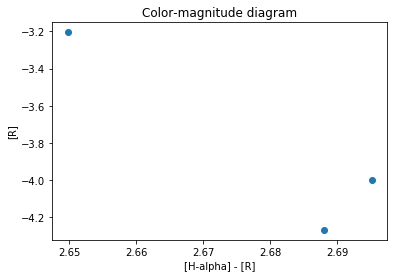

In [182]:
_=pl.plot(sources_halpha['mag_ha'] - sources_halpha['mag_rband'], sources_halpha['mag_rband'], 'o')
_=pl.title("Color-magnitude diagram")
_=pl.xlabel('[H-alpha] - [R]')
_=pl.ylabel('[R]')

In [183]:
xx = np.array(sources_halpha['xcentroid'])
yy = np.array(sources_halpha['ycentroid'])
xy_halpha = np.array([xx,yy]).T
kdt_halpha = KDTree(xy_halpha)
sources_rband.add_column(col=np.zeros(len(sources_rband), dtype='int'), name='halpha_match_number')
sources_rband.add_column(col=np.zeros(len(sources_rband), dtype='float'), name='halpha_match_separation')
for row in sources_rband:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdt_halpha.query(xy)
    row['halpha_match_number'] = index
    row['halpha_match_separation'] = matchdistance
    
sources_rband.rename_column('peak', 'peak_rband')
sources_rband.rename_column('flux', 'flux_rband')
sources_rband.rename_column('mag', 'mag_rband')

indices = sources_rband['halpha_match_number']
sources_rband.add_column(col=sources_halpha['peak_ha'][indices], name='peak_ha')
sources_rband.add_column(col=sources_halpha['mag_ha'][indices], name='mag_ha')
sources_rband.add_column(col=sources_halpha['flux_ha'][indices], name='flux_ha')

In [184]:
halpha_match_numbers = np.unique(sources_rband['halpha_match_number'])
sources_rband.add_column(col=np.ones(len(sources_rband), dtype='bool'), name='halpha_matched')
for idnumber in halpha_match_numbers:
    selection = sources_rband['halpha_match_number'] == idnumber
    separations = sources_rband['halpha_match_separation'][selection]
    closest = np.where(selection)[0][np.argmin(separations)]
    selection[closest] = False
    for ha_col in ('peak_ha', 'mag_ha', 'flux_ha'):
        sources_rband[ha_col][selection] = np.nan
    sources_rband['halpha_matched'][selection] = False

In [185]:
good_halpha_matches = sources_rband['halpha_matched']
sources_rband[good_halpha_matches]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_rband,flux_rband,mag_rband,halpha_match_number,halpha_match_separation,peak_ha,mag_ha,flux_ha,halpha_matched
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,float64,bool
7,1291.1363050635475,852.5905980356065,0.5420817541886899,-0.19906236493763751,0.11707262470121502,25,0.0,14791.0,19.127961180107395,-3.204171704287195,0,0.0,629.0,-0.5543610715768108,1.6662663681686936,True
28,1069.6749537213398,1727.6717267852832,0.5400900487457332,0.28161908518121853,0.6796253665207518,25,0.0,33397.0,39.75003695010809,-3.9983438417403794,1,0.6518550721055573,1483.0,-1.303162729334837,3.3209710653493856,True
62,1458.97395871629,2255.034827878373,0.5963356664956111,-0.2732789412152513,-0.05208888791410037,25,0.0,39708.5,50.92407705706045,-4.267307916583154,2,1.0011749740305689,1858.5,-1.5792677641403468,4.282595986487319,True


## H-alpha v. B

In [186]:
yy = sources_bband['ycentroid']
xx = sources_bband['xcentroid']
in_box = (xx>1000) & (xx<1500) & (yy>500) & (yy<1000)
sources_bband[in_box]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64
1,1009.9842522747284,562.9166483862566,0.542184237995825,-0.1624488044817592,0.20587884405370468,25,0.0,679.5,1.487325477977107,-0.4310150437356677
2,1010.000622676813,562.8209880229092,0.5486904331197027,0.6224720954261231,0.6826471274749591,25,0.0,596.0,1.2015354216242617,-0.19934144615025678
3,1358.885178767713,806.2676282857258,0.5441867675290886,0.13470574018256307,0.6088614237825448,25,0.0,2371.5,4.431691713342869,-1.6164238536630726


In [187]:
halpha_star = sources_halpha[sources_halpha['id'] == 1]
bband_star = sources_bband[sources_bband['id'] == 3]
dx = halpha_star['xcentroid'] - bband_star['xcentroid']
dy = halpha_star['ycentroid'] - bband_star['ycentroid']
sources_bband['xcentroid'] = sources_bband['xcentroid'] + dx
sources_bband['ycentroid'] = sources_bband['ycentroid'] + dy
bband_star = sources_bband[sources_bband['id'] == 3]
halpha_star['xcentroid', 'ycentroid'], bband_star['xcentroid', 'ycentroid']

(<Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065, <Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065)

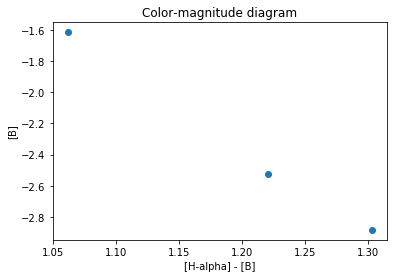

In [188]:
xx = np.array(sources_bband['xcentroid'])
yy = np.array(sources_bband['ycentroid'])
xy_bband = np.array([xx,yy]).T
kdtb = KDTree(xy_bband)
sources_halpha.add_column(col=np.zeros(len(sources_halpha), dtype='int'), name='bband_match_number')
for row in sources_halpha:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdtb.query(xy)
    row['bband_match_number'] = index

indices = sources_halpha['bband_match_number']
sources_halpha.add_column(col=sources_bband['peak'][indices], name='peak_bband')
sources_halpha.add_column(col=sources_bband['mag'][indices], name='mag_bband')
sources_halpha.add_column(col=sources_bband['flux'][indices], name='flux_bband')
_=pl.plot(sources_halpha['mag_ha'] - sources_halpha['mag_bband'], sources_halpha['mag_bband'], 'o')
_=pl.title("Color-magnitude diagram")
_=pl.xlabel('[H-alpha] - [B]')
_=pl.ylabel('[B]')

In [189]:
xx = np.array(sources_halpha['xcentroid'])
yy = np.array(sources_halpha['ycentroid'])
xy_halpha = np.array([xx,yy]).T
kdt_halpha = KDTree(xy_halpha)
sources_bband.add_column(col=np.zeros(len(sources_bband), dtype='int'), name='halpha_match_number')
sources_bband.add_column(col=np.zeros(len(sources_bband), dtype='float'), name='halpha_match_separation')
for row in sources_bband:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdt_halpha.query(xy)
    row['halpha_match_number'] = index
    row['halpha_match_separation'] = matchdistance
    
sources_bband.rename_column('peak', 'peak_bband')
sources_bband.rename_column('flux', 'flux_bband')
sources_bband.rename_column('mag', 'mag_bband')

indices = sources_bband['halpha_match_number']
sources_bband.add_column(col=sources_halpha['peak_ha'][indices], name='peak_ha')
sources_bband.add_column(col=sources_halpha['mag_ha'][indices], name='mag_ha')
sources_bband.add_column(col=sources_halpha['flux_ha'][indices], name='flux_ha')

halpha_match_numbers = np.unique(sources_bband['halpha_match_number'])
sources_bband.add_column(col=np.ones(len(sources_bband), dtype='bool'), name='halpha_matched')
for idnumber in halpha_match_numbers:
    selection = sources_bband['halpha_match_number'] == idnumber
    separations = sources_bband['halpha_match_separation'][selection]
    closest = np.where(selection)[0][np.argmin(separations)]
    selection[closest] = False
    for ha_col in ('peak_ha', 'mag_ha', 'flux_ha'):
        sources_bband[ha_col][selection] = np.nan
    sources_bband['halpha_matched'][selection] = False
    
good_halpha_matches = sources_bband['halpha_matched']
sources_bband[good_halpha_matches]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_bband,flux_bband,mag_bband,halpha_match_number,halpha_match_separation,peak_ha,mag_ha,flux_ha,halpha_matched
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,float64,bool
3,1291.1363050635475,852.5905980356065,0.5441867675290886,0.13470574018256307,0.6088614237825448,25,0.0,2371.5,4.431691713342869,-1.6164238536630726,0,0.0,629.0,-0.5543610715768108,1.6662663681686936,True
7,1069.796308530508,1727.4489229365342,0.5462224473553108,0.6279772358849787,0.6165144942810553,25,0.0,4734.5,10.22149685687533,-2.5237862485670752,1,0.9044334903175479,1483.0,-1.303162729334837,3.3209710653493856,True
9,1458.4840794909055,2254.812836134607,0.5826464295431497,0.5347902029926989,0.46355188005049797,25,0.0,7080.5,14.227256642106061,-2.882802914290896,2,1.1792453213553906,1858.5,-1.5792677641403468,4.282595986487319,True


## H-alpha v. O III

In [190]:
sources_oband = sources_oband[[0,2]]
sources_oband

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64
1,1021.7258267472957,1736.8508446500457,0.6300711719922798,0.24463683315577434,-0.10073065247805155,25,0.0,850.5,1.912754969225281,-0.7041483472726693
3,1410.8432231200902,2265.5303362083273,0.699847722457627,0.44148910978120987,0.15524149108589938,25,0.0,936.0,2.01358172698543,-0.7599231534686095


In [191]:
yy = sources_oband['ycentroid']
xx = sources_oband['xcentroid']
in_box = (xx>1300) & (xx<1500) & (yy>2200) & (yy<2300)
sources_oband[in_box]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64
3,1410.8432231200902,2265.5303362083273,0.699847722457627,0.44148910978120987,0.15524149108589938,25,0.0,936.0,2.01358172698543,-0.7599231534686095


In [192]:
halpha_star = sources_halpha[sources_halpha['id'] == 3]
halpha_star

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_ha,flux_ha,mag_ha,vband_match_number,peak_vband,mag_vband,flux_vband,rband_match_number,peak_rband,mag_rband,flux_rband,bband_match_number,peak_bband,mag_bband,flux_bband
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,int32,float64,float64,float64,int32,float64,float64,float64
3,1458.6463058270017,2255.980869586104,0.5758547601914408,0.5874015495054605,0.5857027333156246,25,0.0,1858.5,4.282595986487319,-1.5792677641403468,32,36413.0,-4.276273399800727,51.34632435501843,61,39708.5,-4.267307916583154,50.92407705706045,8,7080.5,-2.882802914290896,14.227256642106061


In [193]:
halpha_star = sources_halpha[sources_halpha['id'] == 3]
oband_star = sources_oband[sources_oband['id'] == 3]
dx = halpha_star['xcentroid'] - oband_star['xcentroid']
dy = halpha_star['ycentroid'] - oband_star['ycentroid']
sources_oband['xcentroid'] = sources_oband['xcentroid'] + dx
sources_oband['ycentroid'] = sources_oband['ycentroid'] + dy
oband_star = sources_oband[sources_oband['id'] == 3]
halpha_star['xcentroid', 'ycentroid'], oband_star['xcentroid', 'ycentroid']

(<Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1458.6463058270017 2255.980869586104, <Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1458.6463058270017 2255.980869586104)

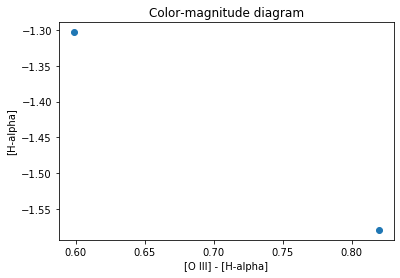

In [194]:
xx = np.array(sources_halpha['xcentroid'])
yy = np.array(sources_halpha['ycentroid'])
xy_halpha = np.array([xx,yy]).T
kdt_halpha = KDTree(xy_halpha)
sources_oband.add_column(col=np.zeros(len(sources_oband), dtype='int'), name='halpha_match_number')
for row in sources_oband:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdt_halpha.query(xy)
    row['halpha_match_number'] = index

indices = sources_oband['halpha_match_number']
sources_oband.add_column(col=sources_halpha['peak_ha'][indices], name='peak_ha')
sources_oband.add_column(col=sources_halpha['mag_ha'][indices], name='mag_ha')
sources_oband.add_column(col=sources_halpha['flux_ha'][indices], name='flux_ha')

sources_oband.rename_column('peak', 'peak_oband')
sources_oband.rename_column('flux', 'flux_oband')
sources_oband.rename_column('mag', 'mag_oband')

_=pl.plot(sources_oband['mag_oband'] - sources_oband['mag_ha'], sources_oband['mag_ha'], 'o')
_=pl.title("Color-magnitude diagram")
_=pl.xlabel('[O III] - [H-alpha]')
_=pl.ylabel('[H-alpha]')

In [195]:
xx = np.array(sources_oband['xcentroid'])
yy = np.array(sources_oband['ycentroid'])
xy_oband = np.array([xx,yy]).T
kdto = KDTree(xy_oband)
sources_halpha.add_column(col=np.zeros(len(sources_halpha), dtype='int'), name='oband_match_number')
sources_halpha.add_column(col=np.zeros(len(sources_halpha), dtype='float'), name='oband_match_separation')
for row in sources_halpha:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdto.query(xy)
    row['oband_match_number'] = index
    row['oband_match_separation'] = matchdistance

indices = sources_halpha['oband_match_number']
sources_halpha.add_column(col=sources_oband['peak_oband'][indices], name='peak_oband')
sources_halpha.add_column(col=sources_oband['mag_oband'][indices], name='mag_oband')
sources_halpha.add_column(col=sources_oband['flux_oband'][indices], name='flux_oband')

oband_match_number = np.unique(sources_halpha['oband_match_number'])
sources_halpha.add_column(col=np.ones(len(sources_halpha), dtype='bool'), name='oband_matched')
for idnumber in oband_match_number:
    selection = sources_halpha['oband_match_number'] == idnumber
    separations = sources_halpha['oband_match_separation'][selection]
    closest = np.where(selection)[0][np.argmin(separations)]
    selection[closest] = False
    for ha_col in ('peak_oband', 'mag_oband', 'flux_oband'):
        sources_halpha[ha_col][selection] = np.nan
    sources_halpha['oband_matched'][selection] = False
    
good_oband_matches = sources_halpha['oband_matched']
sources_halpha[good_oband_matches]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_ha,flux_ha,mag_ha,vband_match_number,peak_vband,mag_vband,flux_vband,rband_match_number,peak_rband,mag_rband,flux_rband,bband_match_number,peak_bband,mag_bband,flux_bband,oband_match_number,oband_match_separation,peak_oband,mag_oband,flux_oband,oband_matched
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,int32,float64,float64,float64,int32,float64,float64,float64,int32,float64,float64,float64,float64,bool
2,1069.4286816288832,1728.2752705629057,0.5518187111922124,0.23815267122251063,0.22458058187795743,25,0.0,1483.0,3.3209710653493856,-1.303162729334837,18,23665.5,-3.6659482887830777,29.26707466448045,27,33397.0,-3.9983438417403794,39.75003695010809,6,4734.5,-2.5237862485670752,10.22149685687533,0,0.979036407321229,850.5,-0.7041483472726693,1.912754969225281,True
3,1458.6463058270017,2255.980869586104,0.5758547601914408,0.5874015495054605,0.5857027333156246,25,0.0,1858.5,4.282595986487319,-1.5792677641403468,32,36413.0,-4.276273399800727,51.34632435501843,61,39708.5,-4.267307916583154,50.92407705706045,8,7080.5,-2.882802914290896,14.227256642106061,1,0.0,936.0,-0.7599231534686095,2.01358172698543,True


## H-alpha v. S II

In [196]:
yy = sources_sband['ycentroid']
xx = sources_sband['xcentroid']
in_box = (xx>1000) & (xx<1500) & (yy>500) & (yy<1000)
sources_sband[in_box]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64
2,1213.1372248491741,876.3320771452145,0.7568181818181815,0.8756508647450991,0.5109073827978124,25,0.0,973.0,1.9821025792553157,-0.7428153166593916
3,1213.5205163319679,876.4675085546103,0.4728682892311131,0.2128829941279415,0.27703975492218447,25,0.0,953.5,2.205457458867437,-0.8587467126910632


In [197]:
halpha_star = sources_halpha[sources_halpha['id'] == 1]
sband_star = sources_sband[sources_sband['id'] == 3]
dx = halpha_star['xcentroid'] - sband_star['xcentroid']
dy = halpha_star['ycentroid'] - sband_star['ycentroid']
sources_sband['xcentroid'] = sources_sband['xcentroid'] + dx
sources_sband['ycentroid'] = sources_sband['ycentroid'] + dy
sband_star = sources_sband[sources_sband['id'] == 3]
halpha_star['xcentroid', 'ycentroid'], sband_star['xcentroid', 'ycentroid']

(<Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065, <Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065)

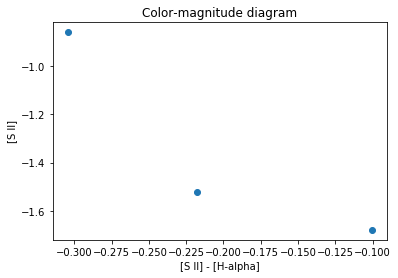

In [198]:
xx = np.array(sources_sband['xcentroid'])
yy = np.array(sources_sband['ycentroid'])
xy_sband = np.array([xx,yy]).T
kdts = KDTree(xy_sband)
sources_halpha.add_column(col=np.zeros(len(sources_halpha), dtype='int'), name='sband_match_number')
for row in sources_halpha:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdts.query(xy)
    row['sband_match_number'] = index

indices = sources_halpha['sband_match_number']
sources_halpha.add_column(col=sources_sband['peak'][indices], name='peak_sband')
sources_halpha.add_column(col=sources_sband['mag'][indices], name='mag_sband')
sources_halpha.add_column(col=sources_sband['flux'][indices], name='flux_sband')
_=pl.plot(sources_halpha['mag_sband'] - sources_halpha['mag_ha'], sources_halpha['mag_sband'], 'o')
_=pl.title("Color-magnitude diagram")
_=pl.xlabel('[S II] - [H-alpha]')
_=pl.ylabel('[S II]')

In [199]:
xx = np.array(sources_halpha['xcentroid'])
yy = np.array(sources_halpha['ycentroid'])
xy_halpha = np.array([xx,yy]).T
kdt_halpha = KDTree(xy_halpha)
sources_sband.add_column(col=np.zeros(len(sources_sband), dtype='int'), name='halpha_match_number')
sources_sband.add_column(col=np.zeros(len(sources_sband), dtype='float'), name='halpha_match_separation')
for row in sources_sband:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdt_halpha.query(xy)
    row['halpha_match_number'] = index
    row['halpha_match_separation'] = matchdistance
    
sources_sband.rename_column('peak', 'peak_sband')
sources_sband.rename_column('flux', 'flux_sband')
sources_sband.rename_column('mag', 'mag_sband')

indices = sources_sband['halpha_match_number']
sources_sband.add_column(col=sources_halpha['peak_ha'][indices], name='peak_ha')
sources_sband.add_column(col=sources_halpha['mag_ha'][indices], name='mag_ha')
sources_sband.add_column(col=sources_halpha['flux_ha'][indices], name='flux_ha')

halpha_match_numbers = np.unique(sources_sband['halpha_match_number'])
sources_sband.add_column(col=np.ones(len(sources_sband), dtype='bool'), name='halpha_matched')
for idnumber in halpha_match_numbers:
    selection = sources_sband['halpha_match_number'] == idnumber
    separations = sources_sband['halpha_match_separation'][selection]
    closest = np.where(selection)[0][np.argmin(separations)]
    selection[closest] = False
    for ha_col in ('peak_ha', 'mag_ha', 'flux_ha'):
        sources_sband[ha_col][selection] = np.nan
    sources_sband['halpha_matched'][selection] = False
    
good_halpha_matches = sources_sband['halpha_matched']
sources_sband[good_halpha_matches]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_sband,flux_sband,mag_sband,halpha_match_number,halpha_match_separation,peak_ha,mag_ha,flux_ha,halpha_matched
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,float64,bool
3,1291.1363050635475,852.5905980356065,0.4728682892311131,0.2128829941279415,0.27703975492218447,25,0.0,953.5,2.205457458867437,-0.8587467126910632,0,0.0,629.0,-0.5543610715768108,1.6662663681686936,True
4,1068.8972340599253,1728.3659710345623,0.6214045902883155,0.18133573576970563,0.08120478345474126,25,0.0,2324.5,4.059691063649582,-1.5212324642033557,1,0.5391317966045049,1483.0,-1.303162729334837,3.3209710653493856,True
5,1458.320058179928,2256.7228519255514,0.5249272102508953,0.0319071747245284,-0.11030543948908549,25,0.0,2786.5,4.697105683309399,-1.6795758294349992,2,0.8105401404453093,1858.5,-1.5792677641403468,4.282595986487319,True


## H-alpha v. I

In [200]:
yy = sources_iband['ycentroid']
xx = sources_iband['xcentroid']
in_box = (xx>1000) & (xx<1500) & (yy>500) & (yy<1000)
sources_iband[in_box]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64
4,1346.2818049024318,841.2778012336153,0.923459721122501,-0.7105409273645308,0.34755461315073566,25,0.0,2757.5,2.0129334050423364,-0.7595735178214268
5,1340.2807613789528,847.394165278012,0.8761819116135644,-0.008616556071368553,0.594605854707568,25,0.0,5293.5,3.9273594003486756,-1.4852516155685571
6,1344.1620631558778,847.0737173886771,0.4671586483582892,0.12514837813701926,-0.023010857235456157,25,0.0,6313.5,6.165458513125436,-1.9749134494160059
7,1336.8108928440677,848.0228387664763,0.5975267252075969,-0.4378259172960085,-0.8026506269752232,25,0.0,4832.0,4.337306710670468,-1.593050335428354
8,1341.7195500309606,847.8213783101173,0.5182467932458871,0.030315128360448754,-0.4840543002395302,25,0.0,6757.0,8.568840598531315,-2.3323051599063147


In [201]:
halpha_star = sources_halpha[sources_halpha['id'] == 1]
iband_star = sources_iband[sources_iband['id'] == 8]
dx = halpha_star['xcentroid'] - iband_star['xcentroid']
dy = halpha_star['ycentroid'] - iband_star['ycentroid']
sources_iband['xcentroid'] = sources_iband['xcentroid'] + dx
sources_iband['ycentroid'] = sources_iband['ycentroid'] + dy
iband_star = sources_iband[sources_iband['id'] == 8]
halpha_star['xcentroid', 'ycentroid'], iband_star['xcentroid', 'ycentroid']

(<Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065, <Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065)

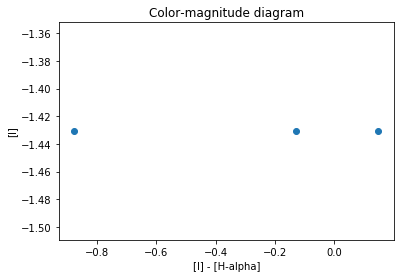

In [202]:
xx = np.array(sources_iband['xcentroid'])
yy = np.array(sources_iband['ycentroid'])
xy_iband = np.array([xx,yy]).T
kdti = KDTree(xy_iband)
sources_halpha.add_column(col=np.zeros(len(sources_halpha), dtype='int'), name='iband_match_number')
for row in sources_halpha:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdti.query(xy)
    row['bband_match_number'] = index

indices = sources_halpha['iband_match_number']
sources_halpha.add_column(col=sources_iband['peak'][indices], name='peak_iband')
sources_halpha.add_column(col=sources_iband['mag'][indices], name='mag_iband')
sources_halpha.add_column(col=sources_iband['flux'][indices], name='flux_iband')
_=pl.plot(sources_halpha['mag_iband'] - sources_halpha['mag_ha'], sources_halpha['mag_iband'], 'o')
_=pl.title("Color-magnitude diagram")
_=pl.xlabel('[I] - [H-alpha]')
_=pl.ylabel('[I]')

In [203]:
xx = np.array(sources_halpha['xcentroid'])
yy = np.array(sources_halpha['ycentroid'])
xy_halpha = np.array([xx,yy]).T
kdt_halpha = KDTree(xy_halpha)
sources_iband.add_column(col=np.zeros(len(sources_iband), dtype='int'), name='halpha_match_number')
sources_iband.add_column(col=np.zeros(len(sources_iband), dtype='float'), name='halpha_match_separation')
for row in sources_iband:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdt_halpha.query(xy)
    row['halpha_match_number'] = index
    row['halpha_match_separation'] = matchdistance
    
sources_iband.rename_column('peak', 'peak_iband')
sources_iband.rename_column('flux', 'flux_iband')
sources_iband.rename_column('mag', 'mag_iband')

indices = sources_iband['halpha_match_number']
sources_iband.add_column(col=sources_halpha['peak_ha'][indices], name='peak_ha')
sources_iband.add_column(col=sources_halpha['mag_ha'][indices], name='mag_ha')
sources_iband.add_column(col=sources_halpha['flux_ha'][indices], name='flux_ha')

halpha_match_numbers = np.unique(sources_iband['halpha_match_number'])
sources_iband.add_column(col=np.ones(len(sources_iband), dtype='bool'), name='halpha_matched')
for idnumber in halpha_match_numbers:
    selection = sources_iband['halpha_match_number'] == idnumber
    separations = sources_iband['halpha_match_separation'][selection]
    closest = np.where(selection)[0][np.argmin(separations)]
    selection[closest] = False
    for ha_col in ('peak_ha', 'mag_ha', 'flux_ha'):
        sources_iband[ha_col][selection] = np.nan
    sources_iband['halpha_matched'][selection] = False
    
good_halpha_matches = sources_iband['halpha_matched']
sources_iband[good_halpha_matches]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_iband,flux_iband,mag_iband,halpha_match_number,halpha_match_separation,peak_ha,mag_ha,flux_ha,halpha_matched
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,float64,bool
8,1291.1363050635475,852.5905980356065,0.5182467932458871,0.030315128360448754,-0.4840543002395302,25,0.0,6757.0,8.568840598531315,-2.3323051599063147,0,0.0,629.0,-0.5543610715768108,1.6662663681686936,True
18,1070.2265266990714,1727.5415888422906,0.7433910538971918,-0.16484352771545246,-0.406559770321038,25,0.0,12562.0,11.65513011449194,-2.66629281555321,1,1.0839029583816235,1483.0,-1.303162729334837,3.3209710653493856,True
37,1460.3276870634118,2256.6309493445897,0.7619836098822389,0.06814893879783399,0.6561241165830624,25,0.0,17238.0,11.43056468305133,-2.6451692139312444,2,1.802677606934984,1858.5,-1.5792677641403468,4.282595986487319,True


# V v. R
(Yes I know I could've skipped a lot of these alignments but I wanted to double check.)

In [204]:
yy = sources_rband['ycentroid']
xx = sources_rband['xcentroid']
in_box = (xx>1000) & (xx<1500) & (yy>500) & (yy<1000)
sources_rband[in_box]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_rband,flux_rband,mag_rband,halpha_match_number,halpha_match_separation,peak_ha,mag_ha,flux_ha,halpha_matched
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,float64,bool
7,1291.1363050635475,852.5905980356065,0.5420817541886899,-0.19906236493763751,0.11707262470121502,25,0.0,14791.0,19.127961180107395,-3.204171704287195,0,0.0,629.0,-0.5543610715768108,1.6662663681686936,True


In [205]:
vband_star = sources_vband[sources_vband['id'] == 6]
rband_star = sources_rband[sources_rband['id'] == 7]
dx = vband_star['xcentroid'] - rband_star['xcentroid']
dy = vband_star['ycentroid'] - rband_star['ycentroid']
sources_rband['xcentroid'] = sources_rband['xcentroid'] + dx
sources_rband['ycentroid'] = sources_rband['ycentroid'] + dy
rband_star = sources_rband[sources_rband['id'] == 7]
vband_star['xcentroid', 'ycentroid'], rband_star['xcentroid', 'ycentroid']

(<Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065, <Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065)

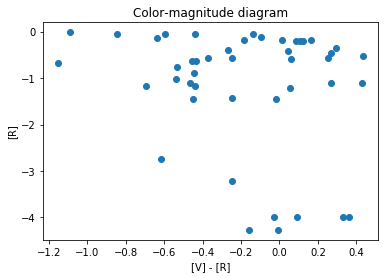

In [206]:
xx = np.array(sources_rband['xcentroid'])
yy = np.array(sources_rband['ycentroid'])
xy_rband = np.array([xx,yy]).T
kdtr = KDTree(xy_rband)
sources_vband.add_column(col=np.zeros(len(sources_vband), dtype='int'), name='rband_match_number')
for row in sources_vband:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdtr.query(xy)
    row['rband_match_number'] = index

indices = sources_vband['rband_match_number']
sources_vband.add_column(col=sources_rband['peak_rband'][indices], name='peak_rband')
sources_vband.add_column(col=sources_rband['mag_rband'][indices], name='mag_rband')
sources_vband.add_column(col=sources_rband['flux_rband'][indices], name='flux_rband')
_=pl.plot(sources_vband['mag_vband'] - sources_vband['mag_rband'], sources_vband['mag_rband'], 'o')
_=pl.title("Color-magnitude diagram")
_=pl.xlabel('[V] - [R]')
_=pl.ylabel('[R]')

In [207]:
xx = np.array(sources_vband['xcentroid'])
yy = np.array(sources_vband['ycentroid'])
xy_vband = np.array([xx,yy]).T
kdtv = KDTree(xy_vband)
sources_rband.add_column(col=np.zeros(len(sources_rband), dtype='int'), name='vband_match_number')
sources_rband.add_column(col=np.zeros(len(sources_rband), dtype='float'), name='vband_match_separation')
for row in sources_rband:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdtv.query(xy)
    row['vband_match_number'] = index
    row['vband_match_separation'] = matchdistance

indices = sources_rband['vband_match_number']
sources_rband.add_column(col=sources_vband['peak_vband'][indices], name='peak_vband')
sources_rband.add_column(col=sources_vband['mag_vband'][indices], name='mag_vband')
sources_rband.add_column(col=sources_vband['flux_vband'][indices], name='flux_vband')

vband_match_numbers = np.unique(sources_rband['vband_match_number'])
sources_rband.add_column(col=np.ones(len(sources_rband), dtype='bool'), name='vband_matched')
for idnumber in vband_match_numbers:
    selection = sources_rband['vband_match_number'] == idnumber
    separations = sources_rband['vband_match_separation'][selection]
    closest = np.where(selection)[0][np.argmin(separations)]
    selection[closest] = False
    for ha_col in ('peak_vband', 'mag_vband', 'flux_vband'):
        sources_rband[ha_col][selection] = np.nan
    sources_rband['vband_matched'][selection] = False
    
good_vband_matches = sources_rband['vband_matched']
sources_rband[good_vband_matches]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_rband,flux_rband,mag_rband,halpha_match_number,halpha_match_separation,peak_ha,mag_ha,flux_ha,halpha_matched,vband_match_number,vband_match_separation,peak_vband,mag_vband,flux_vband,vband_matched
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,float64,bool,int32,float64,float64,float64,float64,bool
1,2432.2118505383714,39.771105619830195,0.6289767634854776,-0.10111869222927143,-0.02803982210695088,25,0.0,7222.0,12.436677678608481,-2.736760947158474,0,1400.9742780407166,nan,nan,nan,False,0,0.7933228057574147,6851.0,-3.3532654432741205,21.943514063811136,True
3,1325.1853607989372,494.58373410341335,0.5441139737367976,-0.04014206346647757,-0.3901477046615827,25,0.0,807.5,1.012314600355713,-0.013288751531035443,0,359.62237530364473,nan,nan,nan,False,2,0.28785154299055693,1230.5,-1.1038685478079633,2.7640597008822376,True
4,941.9787475341827,609.0923135847972,0.6911900369003692,0.18432770212577504,0.5900153017808814,25,0.0,1542.0,1.8795587098811197,-0.6851397397018345,0,425.67876915622526,nan,nan,nan,False,4,0.31564181026926613,2497.0,-1.8359897658183735,5.424952080311497,True
7,1291.1363050635475,852.5905980356065,0.5420817541886899,-0.19906236493763751,0.11707262470121502,25,0.0,14791.0,19.127961180107395,-3.204171704287195,0,0.0,629.0,-0.5543610715768108,1.6662663681686936,True,5,0.0,13529.0,-3.4492011093647266,23.970684938594978,True
8,2668.277626956645,892.3540149658686,0.37232436882546666,0.03174952375714336,0.06812568484022855,25,0.0,798.5,1.4667642198947088,-0.41590076819990673,0,1377.7152644111327,nan,nan,nan,False,6,0.4040013653748529,848.5,-0.37166715045236054,1.4082081717688475,True
12,1161.7715235541184,1097.2594780442428,0.7306704671489054,-0.2896987000339191,-0.33893169143483454,25,0.0,2313.5,2.9591861831164077,-1.1779307263151897,0,276.76363117227453,nan,nan,nan,False,9,0.43447519119495814,3162.0,-1.6167341896345508,4.4329586048020975,True
13,1161.2486532073256,1097.815202797783,0.4875905151547746,-0.05036748892866268,0.448741354558415,25,0.0,1972.5,3.070094513684313,-1.217879363888192,0,277.4993853785785,nan,nan,nan,False,10,0.6296513964218022,3083.0,-1.8713721951735791,5.604654919158063,True
16,661.9903632113908,1458.6434093674084,0.8033002192550255,-0.31345130305488333,0.3068402534451022,25,0.0,1200.0,1.675782972050044,-0.5605444328953016,1,488.57683519240027,nan,nan,nan,False,13,0.24351805694447767,1402.5,-0.9346417594697456,2.365139186980245,True
17,661.2395462865908,1459.5710573237116,0.6299953841419631,0.09819267090412126,-0.0014848940585200938,25,0.0,1098.0,2.012367978236584,-0.7592684950170554,1,488.69246405483136,nan,nan,nan,False,12,0.9995537224062125,1068.0,-0.309883939841715,1.330312206180275,True


## V v. B

In [208]:
yy = sources_bband['ycentroid']
xx = sources_bband['xcentroid']
in_box = (xx>1000) & (xx<1500) & (yy>500) & (yy<1000)
sources_bband[in_box]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_bband,flux_bband,mag_bband,halpha_match_number,halpha_match_separation,peak_ha,mag_ha,flux_ha,halpha_matched
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,float64,bool
3,1291.1363050635475,852.5905980356065,0.5441867675290886,0.13470574018256307,0.6088614237825448,25,0.0,2371.5,4.431691713342869,-1.6164238536630726,0,0.0,629.0,-0.5543610715768108,1.6662663681686936,True


In [209]:
bband_star = sources_bband[sources_bband['id'] == 3]
dx = vband_star['xcentroid'] - bband_star['xcentroid']
dy = vband_star['ycentroid'] - bband_star['ycentroid']
sources_bband['xcentroid'] = sources_bband['xcentroid'] + dx
sources_bband['ycentroid'] = sources_bband['ycentroid'] + dy
bband_star = sources_bband[sources_bband['id'] == 3]
vband_star['xcentroid', 'ycentroid'], bband_star['xcentroid', 'ycentroid']

(<Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065, <Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065)

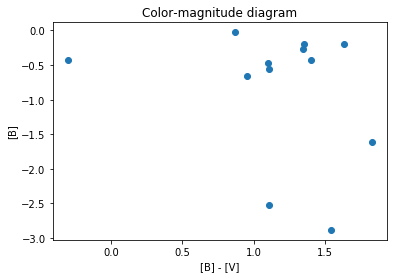

In [210]:
sources_bband.add_column(col=np.zeros(len(sources_bband), dtype='int'), name='vband_match_number')
for row in sources_bband:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdtv.query(xy)
    row['vband_match_number'] = index

indices = sources_bband['vband_match_number']
sources_bband.add_column(col=sources_vband['peak_vband'][indices], name='peak_vband')
sources_bband.add_column(col=sources_vband['mag_vband'][indices], name='mag_vband')
sources_bband.add_column(col=sources_vband['flux_vband'][indices], name='flux_vband')
_=pl.plot(sources_bband['mag_bband'] - sources_bband['mag_vband'], sources_bband['mag_bband'], 'o')
_=pl.title("Color-magnitude diagram")
_=pl.xlabel('[B] - [V]')
_=pl.ylabel('[B]')

In [211]:
sources_vband.add_column(col=np.zeros(len(sources_vband), dtype='int'), name='bband_match_number')
sources_vband.add_column(col=np.zeros(len(sources_vband), dtype='float'), name='bband_match_separation')
for row in sources_vband:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdtb.query(xy)
    row['bband_match_number'] = index
    row['bband_match_separation'] = matchdistance

indices = sources_vband['bband_match_number']
sources_vband.add_column(col=sources_bband['peak_bband'][indices], name='peak_bband')
sources_vband.add_column(col=sources_bband['mag_bband'][indices], name='mag_bband')
sources_vband.add_column(col=sources_bband['flux_bband'][indices], name='flux_bband')

bband_match_numbers = np.unique(sources_vband['bband_match_number'])
sources_vband.add_column(col=np.ones(len(sources_vband), dtype='bool'), name='bband_matched')
for idnumber in bband_match_numbers:
    selection = sources_vband['bband_match_number'] == idnumber
    separations = sources_vband['bband_match_separation'][selection]
    closest = np.where(selection)[0][np.argmin(separations)]
    selection[closest] = False
    for ha_col in ('peak_bband', 'mag_bband', 'flux_bband'):
        sources_vband[ha_col][selection] = np.nan
    sources_vband['bband_matched'][selection] = False
    
good_bband_matches = sources_vband['bband_matched']
sources_vband[good_bband_matches]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_vband,flux_vband,mag_vband,halpha_match_number,halpha_match_separation,peak_ha,mag_ha,flux_ha,halpha_matched,rband_match_number,peak_rband,mag_rband,flux_rband,bband_match_number,bband_match_separation,peak_bband,mag_bband,flux_bband,bband_matched
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,float64,bool,int32,float64,float64,float64,int32,float64,float64,float64,float64,bool
4,938.6813677225605,608.6461921133777,0.5712814996926858,0.21983704670457682,-0.8189454837932786,25,0.0,1594.0,2.1799121039479847,-0.8460974570161662,0,428.6412906344748,nan,nan,nan,False,4,1597.5,-1.113562945900838,2.7888501429439945,0,3.6032135035560073,679.5,-0.4310150437356677,1.487325477977107,True
5,942.1764665284239,608.8462710037136,0.6103668834993143,-0.08530714198673546,0.2158210293508852,25,0.0,2497.0,5.424952080311497,-1.8359897658183735,0,425.65745132757854,nan,nan,nan,False,3,1542.0,-0.6851397397018345,1.8795587098811197,1,0.3070583965492633,596.0,-0.19934144615025678,1.2015354216242617,True
6,1291.1363050635475,852.5905980356065,0.5612283407859657,-0.15230740706562618,0.24897513735424842,25,0.0,13529.0,23.970684938594978,-3.4492011093647266,0,0.0,629.0,-0.5543610715768108,1.6662663681686936,True,6,14791.0,-3.204171704287195,19.127961180107395,2,0.0,2371.5,-1.6164238536630726,4.431691713342869,True
10,1162.16599401958,1097.4415817060467,0.6025339675808383,0.11082899054012207,0.7278141335789251,25,0.0,3162.0,4.4329586048020975,-1.6167341896345508,0,276.7405740674105,nan,nan,nan,False,11,2313.5,-1.1779307263151897,2.9591861831164077,4,0.2146749498892261,1033.0,-0.6628496114141659,1.8413648328809713,True
15,260.94241872797545,1468.0163599104612,0.566337073106049,0.5540490517009866,0.5603579335793357,25,0.0,2021.0,4.197230035743906,-1.5574069301269453,1,849.3437100923705,nan,nan,nan,False,19,1597.5,-1.0185032863972392,2.5550612443748335,5,0.41153133820683024,476.5,-0.20102362828414455,1.2033984598012695,True
17,1069.7893445355035,1727.6874533047765,0.5167121828418902,-0.28479786370769644,-0.0920425022185851,25,0.0,28831.5,28.449589589254963,-3.6351900142260107,1,0.6896425604371936,nan,nan,nan,False,27,33397.0,-3.9983438417403794,39.75003695010809,6,0.23863200497876835,4734.5,-2.5237862485670752,10.22149685687533,True
28,1175.6800480168597,2167.2773808151023,0.5926341964214288,0.5389309067931253,0.2045317277312643,25,0.0,3128.5,4.6380152509188255,-1.6658304309247147,2,296.5437775088578,nan,nan,nan,False,48,2906.0,-1.418169595868535,3.6920522483468066,7,1.1896692886496438,668.5,-0.5579388882390621,1.671766257500784,True
32,1459.2194546833116,2254.2331930315904,0.6279098070958501,0.2836366017300249,0.42666347573918056,25,0.0,38523.0,58.87626082429659,-4.42485055143247,2,1.8392588047051017,nan,nan,nan,False,61,39708.5,-4.267307916583154,50.92407705706045,8,0.9363561290882254,7080.5,-2.882802914290896,14.227256642106061,True
40,1450.9018041972204,2368.9680367288674,0.517550970307426,0.3432346890138817,0.39728867668111295,25,0.0,2475.5,4.240228443845986,-1.568473137489585,2,113.25227257958441,nan,nan,nan,False,77,1959.0,-1.1008967487848702,2.7565044600852757,9,1.0757277110613268,757.0,-0.46953694819256875,1.5410430787474712,True


## V v. O III

In [212]:
yy = sources_oband['ycentroid']
xx = sources_oband['xcentroid']
in_box = (xx>1300) & (xx<1500) & (yy>2200) & (yy<2300)
sources_oband[in_box]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_oband,flux_oband,mag_oband,halpha_match_number,peak_ha,mag_ha,flux_ha
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64
3,1458.6463058270017,2255.980869586104,0.699847722457627,0.44148910978120987,0.15524149108589938,25,0.0,936.0,2.01358172698543,-0.7599231534686095,2,1858.5,-1.5792677641403468,4.282595986487319


In [213]:
vtemp = sources_vband[sources_vband['id'] == 33]
oband_star = sources_oband[sources_oband['id'] == 3]
dx = vtemp['xcentroid'] - oband_star['xcentroid']
dy = vtemp['ycentroid'] - oband_star['ycentroid']
sources_oband['xcentroid'] = sources_oband['xcentroid'] + dx
sources_oband['ycentroid'] = sources_oband['ycentroid'] + dy
oband_star = sources_oband[sources_oband['id'] == 3]
vtemp['xcentroid', 'ycentroid'], oband_star['xcentroid', 'ycentroid']

(<Table length=1>
     xcentroid         ycentroid     
      float64           float64      
 ----------------- ------------------
 1459.878420553399 2255.1878267915827, <Table length=1>
     xcentroid         ycentroid     
      float64           float64      
 ----------------- ------------------
 1459.878420553399 2255.1878267915827)

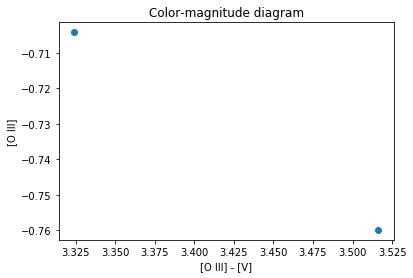

In [214]:
sources_oband.add_column(col=np.zeros(len(sources_oband), dtype='int'), name='vband_match_number')
for row in sources_oband:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdtv.query(xy)
    row['vband_match_number'] = index

indices = sources_oband['vband_match_number']
sources_oband.add_column(col=sources_vband['peak_vband'][indices], name='peak_vband')
sources_oband.add_column(col=sources_vband['mag_vband'][indices], name='mag_vband')
sources_oband.add_column(col=sources_vband['flux_vband'][indices], name='flux_vband')
_=pl.plot(sources_oband['mag_oband'] - sources_oband['mag_vband'], sources_oband['mag_oband'], 'o')
_=pl.title("Color-magnitude diagram")
_=pl.xlabel('[O III] - [V]')
_=pl.ylabel('[O III]')

In [215]:
sources_vband.add_column(col=np.zeros(len(sources_vband), dtype='int'), name='oband_match_number')
sources_vband.add_column(col=np.zeros(len(sources_vband), dtype='float'), name='oband_match_separation')
for row in sources_vband:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdto.query(xy)
    row['oband_match_number'] = index
    row['oband_match_separation'] = matchdistance

indices = sources_vband['oband_match_number']
sources_vband.add_column(col=sources_oband['peak_oband'][indices], name='peak_oband')
sources_vband.add_column(col=sources_oband['mag_oband'][indices], name='mag_oband')
sources_vband.add_column(col=sources_oband['flux_oband'][indices], name='flux_oband')

oband_match_numbers = np.unique(sources_vband['oband_match_number'])
sources_vband.add_column(col=np.ones(len(sources_vband), dtype='bool'), name='oband_matched')
for idnumber in oband_match_numbers:
    selection = sources_vband['oband_match_number'] == idnumber
    separations = sources_vband['oband_match_separation'][selection]
    closest = np.where(selection)[0][np.argmin(separations)]
    selection[closest] = False
    for ha_col in ('peak_oband', 'mag_oband', 'flux_oband'):
        sources_vband[ha_col][selection] = np.nan
    sources_vband['oband_matched'][selection] = False
    
good_oband_matches = sources_vband['oband_matched']
sources_vband[good_oband_matches]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_vband,flux_vband,mag_vband,halpha_match_number,halpha_match_separation,peak_ha,mag_ha,flux_ha,halpha_matched,rband_match_number,peak_rband,mag_rband,flux_rband,bband_match_number,bband_match_separation,peak_bband,mag_bband,flux_bband,bband_matched,oband_match_number,oband_match_separation,peak_oband,mag_oband,flux_oband,oband_matched
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,float64,bool,int32,float64,float64,float64,int32,float64,float64,float64,float64,bool,int32,float64,float64,float64,float64,bool
17,1069.7893445355035,1727.6874533047765,0.5167121828418902,-0.28479786370769644,-0.0920425022185851,25,0.0,28831.5,28.449589589254963,-3.6351900142260107,1,0.6896425604371936,nan,nan,nan,False,27,33397.0,-3.9983438417403794,39.75003695010809,6,0.23863200497876835,4734.5,-2.5237862485670752,10.22149685687533,True,0,0.46570436013102984,850.5,-0.7041483472726693,1.912754969225281,True
33,1459.878420553399,2255.1878267915827,0.5795365519918619,0.5559241309023739,0.31065429901167746,25,0.0,36413.0,51.34632435501843,-4.276273399800727,2,1.4652725251458578,1858.5,-1.5792677641403468,4.282595986487319,True,61,39708.5,-4.267307916583154,50.92407705706045,8,1.4438853802759888,nan,nan,nan,False,1,1.4652725251458578,936.0,-0.7599231534686095,2.01358172698543,True


## V v. S II

In [216]:
yy = sources_sband['ycentroid']
xx = sources_sband['xcentroid']
in_box = (xx>1000) & (xx<1500) & (yy>500) & (yy<1000)
sources_sband[in_box]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_sband,flux_sband,mag_sband,halpha_match_number,halpha_match_separation,peak_ha,mag_ha,flux_ha,halpha_matched
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,float64,bool
2,1290.7530135807538,852.4551666262107,0.7568181818181815,0.8756508647450991,0.5109073827978124,25,0.0,973.0,1.9821025792553157,-0.7428153166593916,0,0.406514486129548,nan,nan,nan,False
3,1291.1363050635475,852.5905980356065,0.4728682892311131,0.2128829941279415,0.27703975492218447,25,0.0,953.5,2.205457458867437,-0.8587467126910632,0,0.0,629.0,-0.5543610715768108,1.6662663681686936,True


In [217]:
sband_star = sources_sband[sources_sband['id'] == 3]
dx = vband_star['xcentroid'] - sband_star['xcentroid']
dy = vband_star['ycentroid'] - sband_star['ycentroid']
sources_sband['xcentroid'] = sources_sband['xcentroid'] + dx
sources_sband['ycentroid'] = sources_sband['ycentroid'] + dy
sband_star = sources_sband[sources_sband['id'] == 3]
vband_star['xcentroid', 'ycentroid'], sband_star['xcentroid', 'ycentroid']

(<Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065, <Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065)

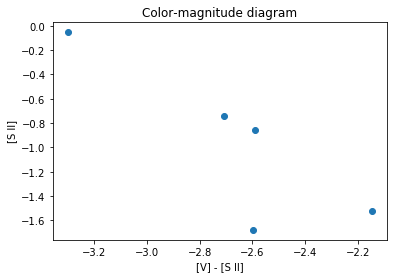

In [218]:
sources_sband.add_column(col=np.zeros(len(sources_sband), dtype='int'), name='vband_match_number')
for row in sources_sband:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdtv.query(xy)
    row['vband_match_number'] = index

indices = sources_sband['vband_match_number']
sources_sband.add_column(col=sources_vband['peak_vband'][indices], name='peak_vband')
sources_sband.add_column(col=sources_vband['mag_vband'][indices], name='mag_vband')
sources_sband.add_column(col=sources_vband['flux_vband'][indices], name='flux_vband')
_=pl.plot(sources_sband['mag_vband'] - sources_sband['mag_sband'], sources_sband['mag_sband'], 'o')
_=pl.title("Color-magnitude diagram")
_=pl.xlabel('[V] - [S II]')
_=pl.ylabel('[S II]')

In [219]:
sources_vband.add_column(col=np.zeros(len(sources_vband), dtype='int'), name='sband_match_number')
sources_vband.add_column(col=np.zeros(len(sources_vband), dtype='float'), name='sband_match_separation')
for row in sources_vband:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdts.query(xy)
    row['sband_match_number'] = index
    row['sband_match_separation'] = matchdistance

indices = sources_vband['sband_match_number']
sources_vband.add_column(col=sources_sband['peak_sband'][indices], name='peak_sband')
sources_vband.add_column(col=sources_sband['mag_sband'][indices], name='mag_sband')
sources_vband.add_column(col=sources_sband['flux_sband'][indices], name='flux_sband')

sband_match_numbers = np.unique(sources_vband['sband_match_number'])
sources_vband.add_column(col=np.ones(len(sources_vband), dtype='bool'), name='sband_matched')
for idnumber in sband_match_numbers:
    selection = sources_vband['sband_match_number'] == idnumber
    separations = sources_vband['sband_match_separation'][selection]
    closest = np.where(selection)[0][np.argmin(separations)]
    selection[closest] = False
    for ha_col in ('peak_sband', 'mag_sband', 'flux_sband'):
        sources_vband[ha_col][selection] = np.nan
    sources_vband['sband_matched'][selection] = False
    
good_sband_matches = sources_vband['sband_matched']
sources_vband[good_sband_matches]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_vband,flux_vband,mag_vband,halpha_match_number,halpha_match_separation,peak_ha,mag_ha,flux_ha,halpha_matched,rband_match_number,peak_rband,mag_rband,flux_rband,bband_match_number,bband_match_separation,peak_bband,mag_bband,flux_bband,bband_matched,oband_match_number,oband_match_separation,peak_oband,mag_oband,flux_oband,oband_matched,sband_match_number,sband_match_separation,peak_sband,mag_sband,flux_sband,sband_matched
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,float64,bool,int32,float64,float64,float64,int32,float64,float64,float64,float64,bool,int32,float64,float64,float64,float64,bool,int32,float64,float64,float64,float64,bool
1,2432.834512578139,39.27952342083648,0.4591395583130978,-0.20870561181021335,-0.7769013329699791,25,0.0,6851.0,21.943514063811136,-3.3532654432741205,0,1401.7666357611251,nan,nan,nan,False,0,7222.0,-2.736760947158474,12.436677678608481,2,1401.7666357611251,nan,nan,nan,False,0,2169.7972138289592,nan,nan,nan,False,0,1.4066917474674314,384.0,-0.052140550067901456,1.049195018746139,True
6,1291.1363050635475,852.5905980356065,0.5612283407859657,-0.15230740706562618,0.24897513735424842,25,0.0,13529.0,23.970684938594978,-3.4492011093647266,0,0.0,629.0,-0.5543610715768108,1.6662663681686936,True,6,14791.0,-3.204171704287195,19.127961180107395,2,0.0,2371.5,-1.6164238536630726,4.431691713342869,True,0,902.3462674734933,nan,nan,nan,False,2,0.0,953.5,-0.8587467126910632,2.205457458867437,True
10,1162.16599401958,1097.4415817060467,0.6025339675808383,0.11082899054012207,0.7278141335789251,25,0.0,3162.0,4.4329586048020975,-1.6167341896345508,0,276.7405740674105,nan,nan,nan,False,11,2313.5,-1.1779307263151897,2.9591861831164077,4,0.2146749498892261,1033.0,-0.6628496114141659,1.8413648328809713,True,0,636.6356826783122,nan,nan,nan,False,1,276.6820651457108,973.0,-0.7428153166593916,1.9821025792553157,True
19,1069.0393065903738,1728.319565458442,0.6178666999801389,-0.27845201546029175,-0.04614704784349982,25,0.0,23665.5,29.26707466448045,-3.6659482887830777,1,0.3918864100536289,1483.0,-1.303162729334837,3.3209710653493856,True,27,33397.0,-3.9983438417403794,39.75003695010809,6,1.153720216655972,nan,nan,nan,False,0,1.1297860895522873,nan,nan,nan,False,3,0.149459296810606,2324.5,-1.5212324642033557,4.059691063649582,True
33,1459.878420553399,2255.1878267915827,0.5795365519918619,0.5559241309023739,0.31065429901167746,25,0.0,36413.0,51.34632435501843,-4.276273399800727,2,1.4652725251458578,1858.5,-1.5792677641403468,4.282595986487319,True,61,39708.5,-4.267307916583154,50.92407705706045,8,1.4438853802759888,nan,nan,nan,False,1,1.4652725251458578,936.0,-0.7599231534686095,2.01358172698543,True,4,2.1874175296376057,2786.5,-1.6795758294349992,4.697105683309399,True


## V v. I

In [220]:
yy = sources_iband['ycentroid']
xx = sources_iband['xcentroid']
in_box = (xx>1000) & (xx<1500) & (yy>500) & (yy<1000)
sources_iband[in_box]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_iband,flux_iband,mag_iband,halpha_match_number,halpha_match_separation,peak_ha,mag_ha,flux_ha,halpha_matched
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,float64,bool
4,1295.6985599350187,846.0470209591044,0.923459721122501,-0.7105409273645308,0.34755461315073566,25,0.0,2757.5,2.0129334050423364,-0.7595735178214268,0,7.977002599246515,nan,nan,nan,False
5,1289.6975164115397,852.1633850035012,0.8761819116135644,-0.008616556071368553,0.594605854707568,25,0.0,5293.5,3.9273594003486756,-1.4852516155685571,0,1.5008743318303153,nan,nan,nan,False
6,1293.5788181884648,851.8429371141663,0.4671586483582892,0.12514837813701926,-0.023010857235456157,25,0.0,6313.5,6.165458513125436,-1.9749134494160059,0,2.5543819641631194,nan,nan,nan,False
7,1286.2276478766546,852.7920584919655,0.5975267252075969,-0.4378259172960085,-0.8026506269752232,25,0.0,4832.0,4.337306710670468,-1.593050335428354,0,4.912789604075461,nan,nan,nan,False
8,1291.1363050635475,852.5905980356065,0.5182467932458871,0.030315128360448754,-0.4840543002395302,25,0.0,6757.0,8.568840598531315,-2.3323051599063147,0,0.0,629.0,-0.5543610715768108,1.6662663681686936,True


In [221]:
iband_star = sources_iband[sources_iband['id'] == 8]
dx = vband_star['xcentroid'] - iband_star['xcentroid']
dy = vband_star['ycentroid'] - iband_star['ycentroid']
sources_iband['xcentroid'] = sources_iband['xcentroid'] + dx
sources_iband['ycentroid'] = sources_iband['ycentroid'] + dy
iband_star = sources_iband[sources_iband['id'] == 8]
vband_star['xcentroid', 'ycentroid'], iband_star['xcentroid', 'ycentroid']

(<Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065, <Table length=1>
     xcentroid          ycentroid    
      float64            float64     
 ------------------ -----------------
 1291.1363050635475 852.5905980356065)

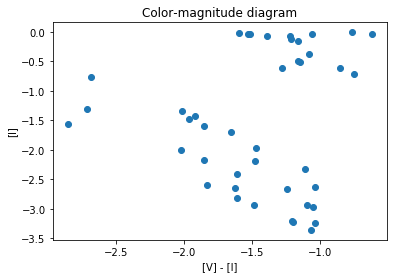

In [222]:
sources_iband.add_column(col=np.zeros(len(sources_iband), dtype='int'), name='vband_match_number')
for row in sources_iband:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdtv.query(xy)
    row['vband_match_number'] = index

indices = sources_iband['vband_match_number']
sources_iband.add_column(col=sources_vband['peak_vband'][indices], name='peak_vband')
sources_iband.add_column(col=sources_vband['mag_vband'][indices], name='mag_vband')
sources_iband.add_column(col=sources_vband['flux_vband'][indices], name='flux_vband')
_=pl.plot(sources_iband['mag_vband'] - sources_iband['mag_iband'], sources_iband['mag_iband'], 'o')
_=pl.title("Color-magnitude diagram")
_=pl.xlabel('[V] - [I]')
_=pl.ylabel('[I]')

In [223]:
sources_vband.add_column(col=np.zeros(len(sources_vband), dtype='int'), name='iband_match_number')
sources_vband.add_column(col=np.zeros(len(sources_vband), dtype='float'), name='iband_match_separation')
for row in sources_vband:
    xy = [row['xcentroid'], row['ycentroid']]
    matchdistance, index = kdti.query(xy)
    row['iband_match_number'] = index
    row['iband_match_separation'] = matchdistance

indices = sources_vband['iband_match_number']
sources_vband.add_column(col=sources_iband['peak_iband'][indices], name='peak_iband')
sources_vband.add_column(col=sources_iband['mag_iband'][indices], name='mag_iband')
sources_vband.add_column(col=sources_iband['flux_iband'][indices], name='flux_iband')

iband_match_numbers = np.unique(sources_vband['iband_match_number'])
sources_vband.add_column(col=np.ones(len(sources_vband), dtype='bool'), name='iband_matched')
for idnumber in iband_match_numbers:
    selection = sources_vband['iband_match_number'] == idnumber
    separations = sources_vband['iband_match_separation'][selection]
    closest = np.where(selection)[0][np.argmin(separations)]
    selection[closest] = False
    for ha_col in ('peak_iband', 'mag_iband', 'flux_iband'):
        sources_vband[ha_col][selection] = np.nan
    sources_vband['iband_matched'][selection] = False
    
good_iband_matches = sources_vband['iband_matched']
sources_vband[good_iband_matches]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak_vband,flux_vband,mag_vband,halpha_match_number,halpha_match_separation,peak_ha,mag_ha,flux_ha,halpha_matched,rband_match_number,peak_rband,mag_rband,flux_rband,bband_match_number,bband_match_separation,peak_bband,mag_bband,flux_bband,bband_matched,oband_match_number,oband_match_separation,peak_oband,mag_oband,flux_oband,oband_matched,sband_match_number,sband_match_separation,peak_sband,mag_sband,flux_sband,sband_matched,iband_match_number,iband_match_separation,peak_iband,mag_iband,flux_iband,iband_matched
int32,float64,float64,float64,float64,float64,int32,float64,float64,float64,float64,int32,float64,float64,float64,float64,bool,int32,float64,float64,float64,int32,float64,float64,float64,float64,bool,int32,float64,float64,float64,float64,bool,int32,float64,float64,float64,float64,bool,int32,float64,float64,float64,float64,bool
1,2432.834512578139,39.27952342083648,0.4591395583130978,-0.20870561181021335,-0.7769013329699791,25,0.0,6851.0,21.943514063811136,-3.3532654432741205,0,1401.7666357611251,nan,nan,nan,False,0,7222.0,-2.736760947158474,12.436677678608481,2,1401.7666357611251,nan,nan,nan,False,0,2169.7972138289592,nan,nan,nan,False,0,1.4066917474674314,384.0,-0.052140550067901456,1.049195018746139,True,2,0.18713432105952502,3044.5,-1.6954292373065116,4.766193773021765,True
3,1325.33938687254,494.8269099234542,0.4436398160991541,-0.19061885487514854,0.14176718025998075,25,0.0,1230.5,2.7640597008822376,-1.1038685478079633,0,359.3949183514453,nan,nan,nan,False,2,807.5,-0.013288751531035443,1.012314600355713,2,359.3949183514453,nan,nan,nan,False,0,1258.7423544499247,nan,nan,nan,False,1,359.29679543482087,nan,nan,nan,False,3,352.46864402019446,2757.5,-0.7595735178214268,2.0129334050423364,True
5,942.1764665284239,608.8462710037136,0.6103668834993143,-0.08530714198673546,0.2158210293508852,25,0.0,2497.0,5.424952080311497,-1.8359897658183735,0,425.65745132757854,nan,nan,nan,False,3,1542.0,-0.6851397397018345,1.8795587098811197,1,0.3070583965492633,596.0,-0.19934144615025678,1.2015354216242617,True,0,1125.6822247630435,nan,nan,nan,False,1,425.265685403064,nan,nan,nan,False,6,421.7591286746221,4832.0,-1.593050335428354,4.337306710670468,True
6,1291.1363050635475,852.5905980356065,0.5612283407859657,-0.15230740706562618,0.24897513735424842,25,0.0,13529.0,23.970684938594978,-3.4492011093647266,0,0.0,629.0,-0.5543610715768108,1.6662663681686936,True,6,14791.0,-3.204171704287195,19.127961180107395,2,0.0,2371.5,-1.6164238536630726,4.431691713342869,True,0,902.3462674734933,nan,nan,nan,False,2,0.0,953.5,-0.8587467126910632,2.205457458867437,True,7,0.0,6757.0,-2.3323051599063147,8.568840598531315,True
10,1162.16599401958,1097.4415817060467,0.6025339675808383,0.11082899054012207,0.7278141335789251,25,0.0,3162.0,4.4329586048020975,-1.6167341896345508,0,276.7405740674105,nan,nan,nan,False,11,2313.5,-1.1779307263151897,2.9591861831164077,4,0.2146749498892261,1033.0,-0.6628496114141659,1.8413648328809713,True,0,636.6356826783122,nan,nan,nan,False,1,276.6820651457108,973.0,-0.7428153166593916,1.9821025792553157,True,8,2.064614273269351,617.0,-0.014530860398434028,1.0134733758129577,True
15,260.94241872797545,1468.0163599104612,0.566337073106049,0.5540490517009866,0.5603579335793357,25,0.0,2021.0,4.197230035743906,-1.5574069301269453,1,849.3437100923705,nan,nan,nan,False,19,1597.5,-1.0185032863972392,2.5550612443748335,5,0.41153133820683024,476.5,-0.20102362828414455,1.2033984598012695,True,0,849.1412330143218,nan,nan,nan,False,3,848.8656569979468,nan,nan,nan,False,9,0.3990732466344398,606.5,-0.03921721343403073,1.036780655359655,True
16,1070.0519079207772,1727.007894477005,0.5636587510727595,0.39869350442833,0.8111787070466465,25,0.0,29456.0,40.85543422791125,-4.028124576787456,1,1.4123219016997812,nan,nan,nan,False,27,33397.0,-3.9983438417403794,39.75003695010809,6,0.5097422391961641,nan,nan,nan,False,0,0.5997165919289377,nan,nan,nan,False,3,1.782594642963306,nan,nan,nan,Fa

## Color-Color Diagram

I opted to only do V - I vs. R - I since many of the other combinations had very few stars. It seemed like there wouldn't be much useful data to get out of just comparing 2 or 3 stars.

In [224]:
sources_ccd = sources_vband[good_iband_matches]
x_ax = sources_ccd['mag_vband'] - sources_ccd['mag_iband']
y_ax = sources_ccd['mag_rband'] - sources_ccd['mag_iband']

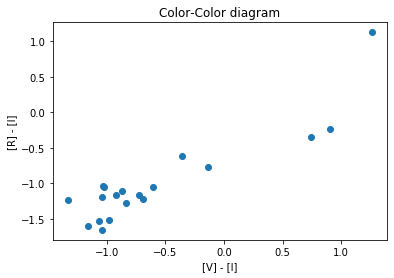

In [226]:
_=pl.plot(y_ax, x_ax, 'o')
_=pl.title("Color-Color diagram")
_=pl.xlabel('[V] - [I]')
_=pl.ylabel('[R] - [I]')

# Index 2

This lab goes through those steps in detail:

0. [Acquire the Data](#0.-Acquire-the-data)
1. [Data Inspection](#1.-Data-Inspection)
 * [Exercise](#STUDENT-TASK-Section-1)
1. [Create master dark](#2.-Create-a-master-dark)
 * [Visualization: Successful Example](#Successful-Visualization-of--a-Dark:)
 * [Bad Pixel Masking](#Bad-Pixel-Masking)
 * [Dark Uncertainty](#Calculate-the-master-dark-variance-per-pixel)
1. [Flatfield](#3a.-Flat-Fielding)
 * [Exercise](#STUDENT-TASK-Section-3)
1. [Combine target data for H-alpha](#4.-Combine-the-target-data)
 * [Centroid Function](#X,Y-centroid-function)
1. [Uncertainty Calculation](#5.-Calculate-the-per-pixel-uncertainty)
1. [Repeat 3,4,5 for V-band](#6.-Repeat-the-above-for-the-V-filter)
1. [Assignment Part 1: Reduce two more bands](#ASSIGNMENT:-Redo-the-above-for-at-least-1-narrow-band-and-at-least-1-broad-band-filter)
1. [Photometry](#Photometry)
1. [Assignment Part 2: Obtain photometry & plot CMD/CCD](#ASSIGNMENT:-Create-photometric-catalogs-of-your-other-filters)

# ASSIGNMENT: Calibrate the data by cross-matching to a catalog

Let's see if we get to this.

# ASSIGNMENT: Fit a World Coordinate System to the data

Let's see if we get to this.